In [107]:
import math
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from matplotlib.lines import Line2D
from matplotlib.ticker import FuncFormatter, LogLocator, ScalarFormatter

from scipy.signal import savgol_filter#, correlate, correlation_lags

#from sklearn.feature_selection import VarianceThreshold
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    #accuracy_score,
    classification_report,
    ConfusionMatrixDisplay,
)
from sklearn.compose import TransformedTargetRegressor
#from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    max_error,
)
#from sklearn.pipeline import Pipeline
#from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import (
    #cross_val_predict,
    #cross_validate,
    #StratifiedGroupKFold,
    StratifiedKFold,
    #train_test_split,
)
from sklearn.pipeline import Pipeline

from tsfresh import extract_features

In [108]:
FILE_TITLE = 'Combined-2'
DATA_PATH = f"../data/02_preprocessed/{FILE_TITLE}/"

In [109]:
DATA = pd.DataFrame()
file_list = os.listdir(DATA_PATH)

for f in file_list:
    if ".csv" in f:
        trial_file = pd.read_csv(f"{DATA_PATH}{f}").dropna()
        DATA = pd.concat([DATA , trial_file] , ignore_index = True)

MATERIALS = list(DATA['Sample'].unique())

MATERIAL_GROUPS = {
'bismuth': 'metal',
'nickel': 'metal',
'titanium': 'metal',
'iron': 'metal',
'aluminum': 'metal',
'copper': 'metal',

'cement': 'ceramic',
'gypsum': 'ceramic',
'carbon': 'ceramic', 'graphite': 'ceramic',

'cork_coarse': 'composite',
'cork_fine': 'composite',
'wood': 'composite',
'abrasive': 'composite',

'pdms': 'polymer',

'ps_foam': 'foam',
'pu_foam': 'foam'}

DATA['Label']=DATA['Sample'].apply(lambda x : MATERIAL_GROUPS[x])
DATA["eff"] = (DATA["k"] * DATA["rho"] * DATA["cp"]) ** 0.5

# Determination of elbow `time`, `value` , and `index`

**Function name:**
- find_first_elbow()

**Returned values:**
- time[elbow_position]
- signal[elbow_position]
- indices[elbow_position]
- time
- smooth_signal

In [110]:
def find_first_elbow(
    subset,
    time_col="Time",
    signal_col="Primary",
    index_col="index",
    smooth_window=15,
    polyorder=2,
    threshold_frac=0.30,
    direction="drop",
    skip_index=5,
):
    df = subset.sort_values(time_col, kind="stable").reset_index(drop=True)

    indices = (
        df[index_col].to_numpy()
        if index_col in df.columns
        else np.arange(len(df))
    )

    df = df.iloc[skip_index:]
    indices = indices[skip_index:]

    time = df[time_col].to_numpy(dtype=float)
    signal = df[signal_col].to_numpy(dtype=float)

    valid = np.isfinite(time) & np.isfinite(signal)
    time = time[valid]
    signal = signal[valid]
    indices = indices[valid]

    n = len(signal)

    if n < 3:
        return np.nan, np.nan, None, time, signal

    window = min(smooth_window, n)

    if window % 2 == 0:
        window -= 1

    if window <= polyorder:
        window = polyorder + 1

        if window % 2 == 0:
            window += 1

    if window > n:
        return np.nan, np.nan, None, time, signal

    smooth_signal = savgol_filter(
        signal,
        window_length=window,
        polyorder=polyorder,
    )

    derivative = np.gradient(smooth_signal, time)

    if direction == "drop":
        strongest_idx = np.argmin(derivative)
        active = derivative < threshold_frac * derivative[strongest_idx]

    elif direction == "rise":
        strongest_idx = np.argmax(derivative)
        active = derivative > threshold_frac * derivative[strongest_idx]

    else:
        raise ValueError("direction must be 'drop' or 'rise'")

    elbow_position = 0

    for position in range(strongest_idx, -1, -1):
        if not active[position]:
            elbow_position = position + 1
            break

    return (
        time[elbow_position],
        signal[elbow_position],
        indices[elbow_position],
        time,
        smooth_signal,
    )

## Storage of elbow `time`, `value` , and `index` into df.DATA

In [111]:
ELBOW_IDX_DICT = {}
DATA["Elbow time"] = np.nan
DATA["Elbow value"] = np.nan
DATA["Elbow index"] = np.nan

for material in MATERIALS:
    current_material = DATA[DATA['Sample'] == material]
    current_material = current_material.sort_values(["Trial", "Time"])

    trial_numbers = sorted(current_material["Trial"].unique())

    ELBOW_IDX_DICT[material] = {}

    for trial in trial_numbers:
        trial = int(trial)
        subset = current_material[current_material["Trial"] == trial]

        (
            ELBOW_TIME,
            ELBOW_VALUE,
            ELBOW_IDX,
            SMOOTH_TIME,
            SMOOTH_PRIMARY,
        ) = find_first_elbow(subset)

        ELBOW_IDX_DICT[material][trial] = int(ELBOW_IDX)

        row_condition = ((DATA["Sample"] == material) & (DATA["Trial"] == trial))

        DATA.loc[row_condition, "Elbow time"]   = ELBOW_TIME
        DATA.loc[row_condition, "Elbow value"]  = ELBOW_VALUE
        DATA.loc[row_condition, "Elbow index"]  = ELBOW_IDX

## Visual inspection of elbow

ps_foam - Trial 1 - elbow index: 78.0, elbow time: 7.801
ps_foam - Trial 2 - elbow index: 86.0, elbow time: 8.601
ps_foam - Trial 3 - elbow index: 60.0, elbow time: 6.001
ps_foam - Trial 4 - elbow index: 103.0, elbow time: 10.301
ps_foam - Trial 5 - elbow index: 96.0, elbow time: 9.601
ps_foam - Trial 6 - elbow index: 114.0, elbow time: 11.401


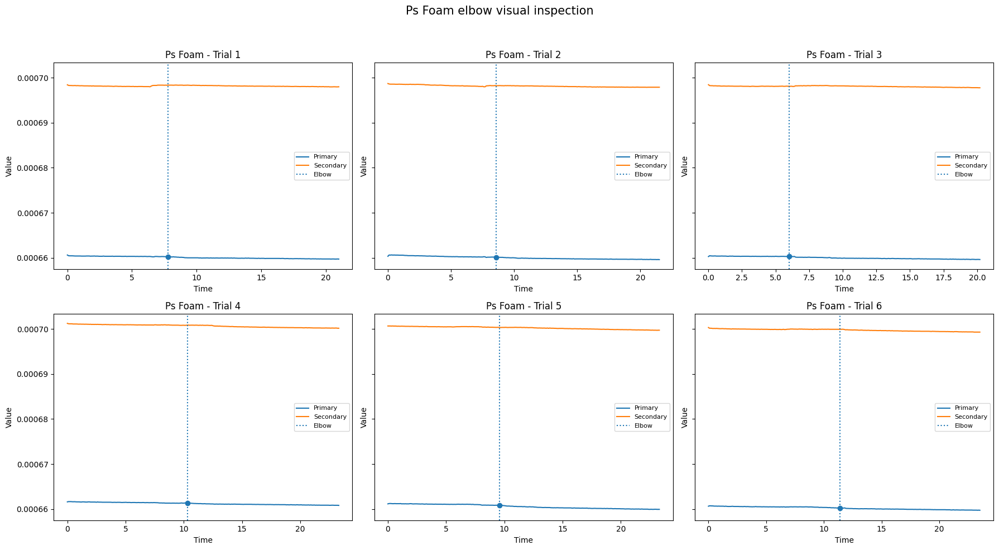

carbon - Trial 1 - elbow index: 151.0, elbow time: 15.101
carbon - Trial 2 - elbow index: 129.0, elbow time: 12.901
carbon - Trial 3 - elbow index: 116.0, elbow time: 11.601
carbon - Trial 4 - elbow index: 143.0, elbow time: 14.301
carbon - Trial 5 - elbow index: 108.0, elbow time: 10.801
carbon - Trial 6 - elbow index: 112.0, elbow time: 11.201


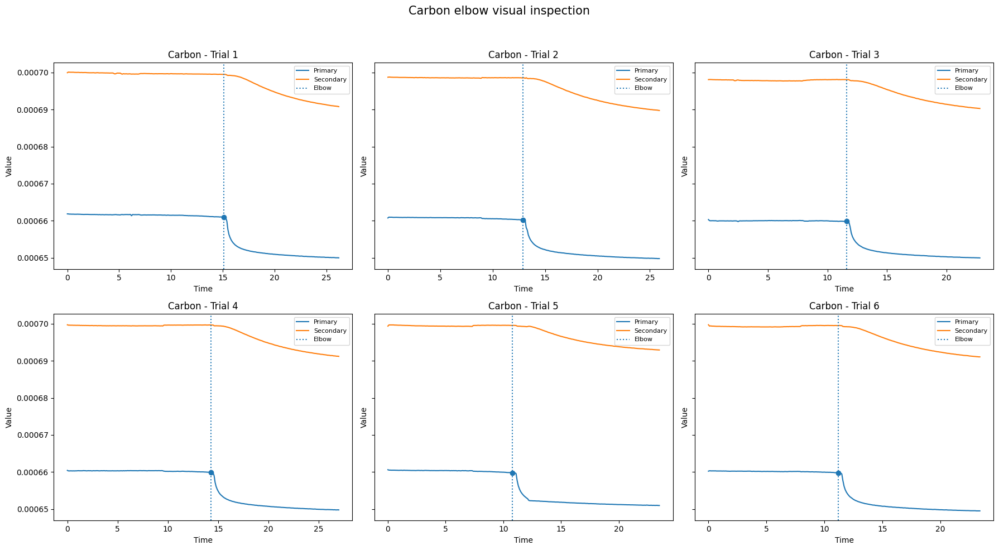

aluminum - Trial 1 - elbow index: 86.0, elbow time: 8.601
aluminum - Trial 2 - elbow index: 92.0, elbow time: 9.201
aluminum - Trial 3 - elbow index: 105.0, elbow time: 10.501
aluminum - Trial 4 - elbow index: 105.0, elbow time: 10.501
aluminum - Trial 5 - elbow index: 104.0, elbow time: 10.401
aluminum - Trial 6 - elbow index: 143.0, elbow time: 14.301


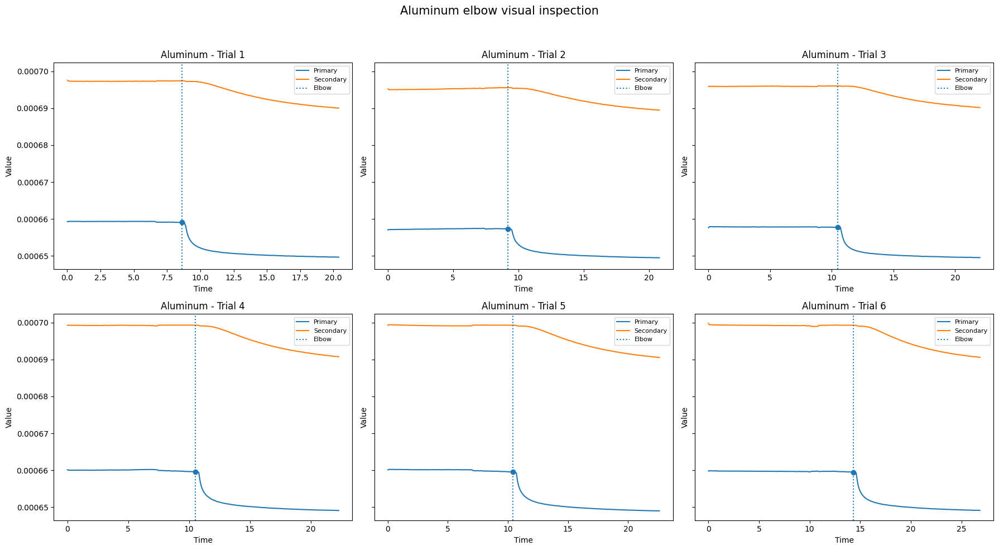

wood - Trial 1 - elbow index: 147.0, elbow time: 14.701
wood - Trial 2 - elbow index: 101.0, elbow time: 10.101
wood - Trial 3 - elbow index: 96.0, elbow time: 9.601
wood - Trial 4 - elbow index: 104.0, elbow time: 10.401
wood - Trial 5 - elbow index: 115.0, elbow time: 11.501
wood - Trial 6 - elbow index: 104.0, elbow time: 10.401


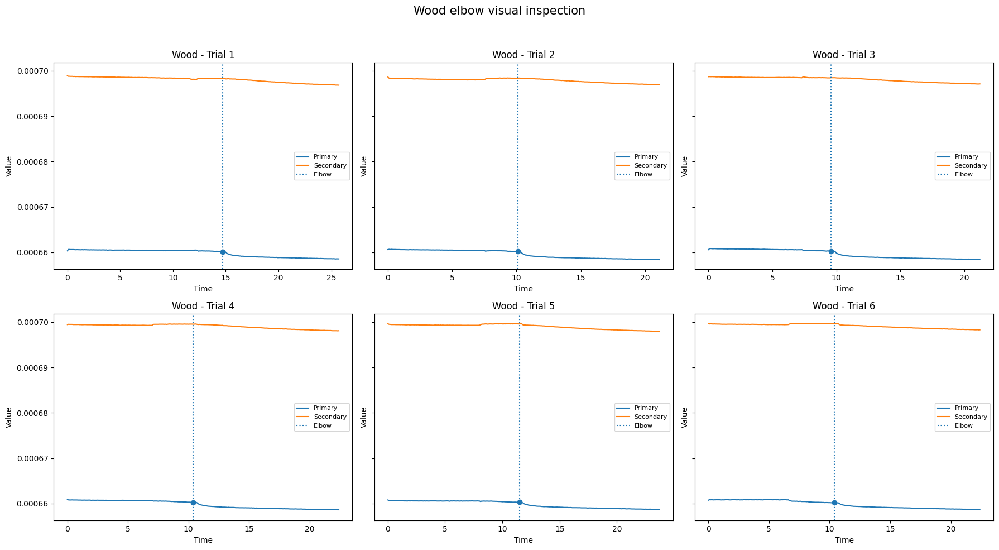

cork_fine - Trial 1 - elbow index: 98.0, elbow time: 9.801
cork_fine - Trial 2 - elbow index: 122.0, elbow time: 12.201
cork_fine - Trial 3 - elbow index: 95.0, elbow time: 9.501
cork_fine - Trial 4 - elbow index: 114.0, elbow time: 11.401
cork_fine - Trial 5 - elbow index: 110.0, elbow time: 11.001
cork_fine - Trial 6 - elbow index: 73.0, elbow time: 7.301


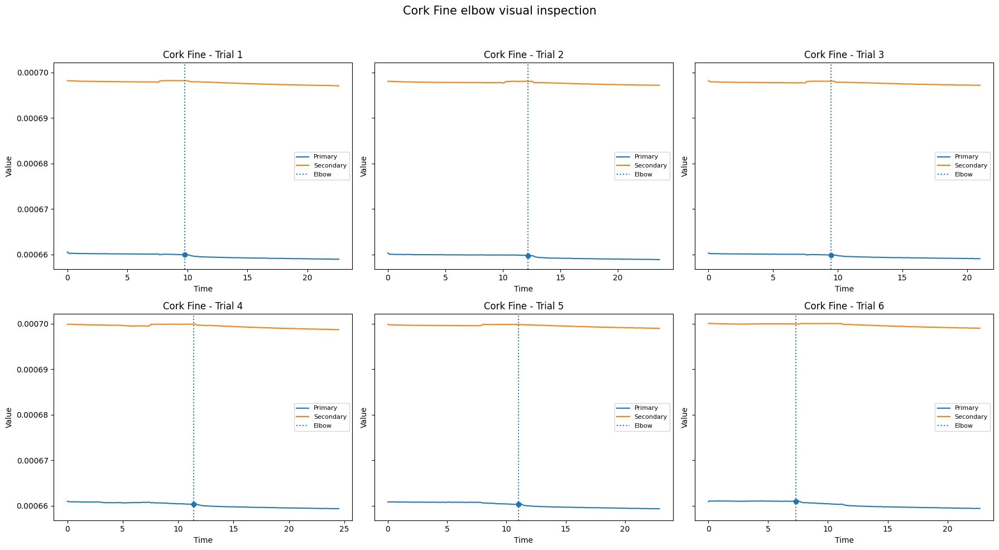

nickel - Trial 1 - elbow index: 161.0, elbow time: 16.101
nickel - Trial 2 - elbow index: 99.0, elbow time: 9.901
nickel - Trial 3 - elbow index: 101.0, elbow time: 10.101
nickel - Trial 4 - elbow index: 112.0, elbow time: 11.201
nickel - Trial 5 - elbow index: 105.0, elbow time: 10.501
nickel - Trial 6 - elbow index: 98.0, elbow time: 9.801


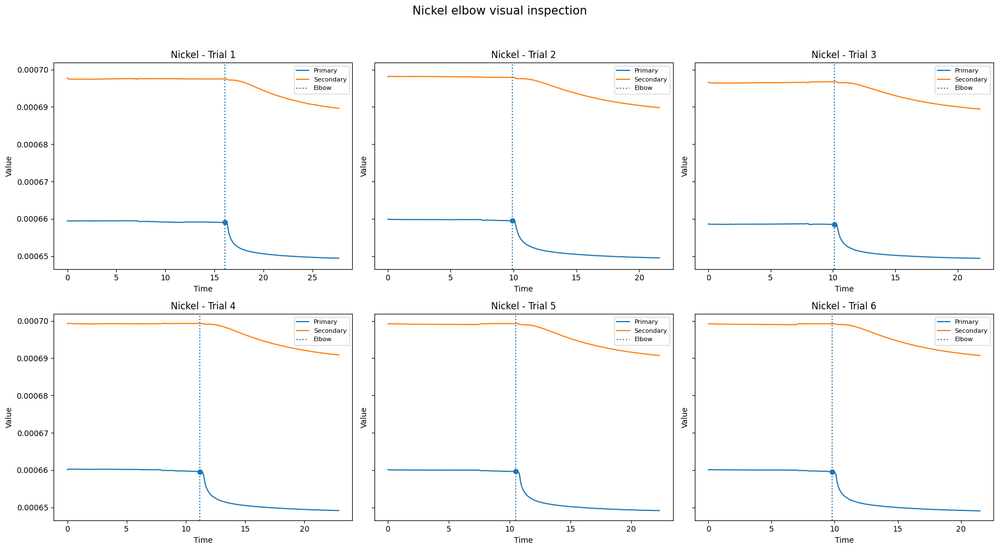

titanium - Trial 1 - elbow index: 84.0, elbow time: 8.401
titanium - Trial 2 - elbow index: 87.0, elbow time: 8.701
titanium - Trial 3 - elbow index: 95.0, elbow time: 9.501
titanium - Trial 4 - elbow index: 118.0, elbow time: 11.801
titanium - Trial 5 - elbow index: 108.0, elbow time: 10.801
titanium - Trial 6 - elbow index: 106.0, elbow time: 10.601


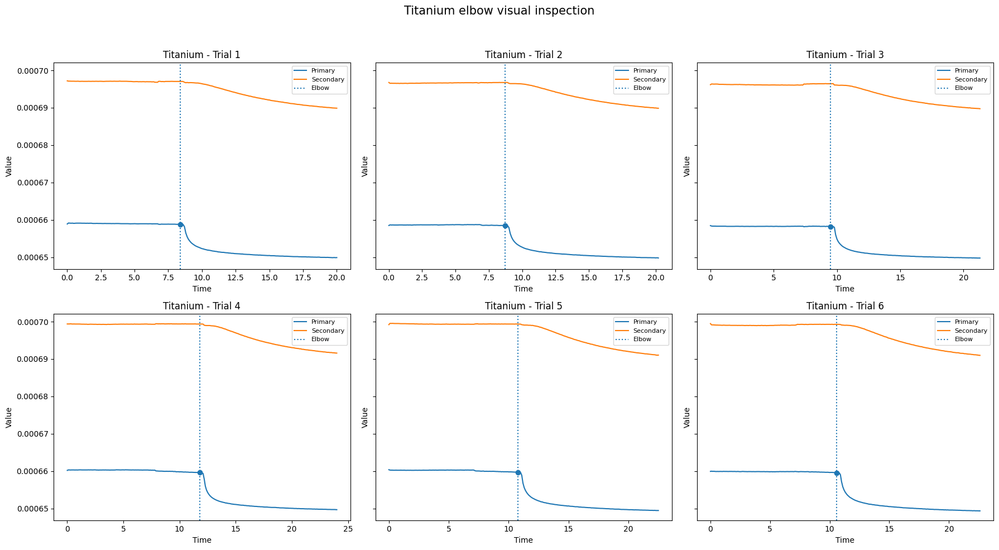

gypsum - Trial 1 - elbow index: 113.0, elbow time: 11.301
gypsum - Trial 2 - elbow index: 107.0, elbow time: 10.701
gypsum - Trial 3 - elbow index: 101.0, elbow time: 10.101
gypsum - Trial 4 - elbow index: 104.0, elbow time: 10.401
gypsum - Trial 5 - elbow index: 107.0, elbow time: 10.701
gypsum - Trial 6 - elbow index: 109.0, elbow time: 10.901


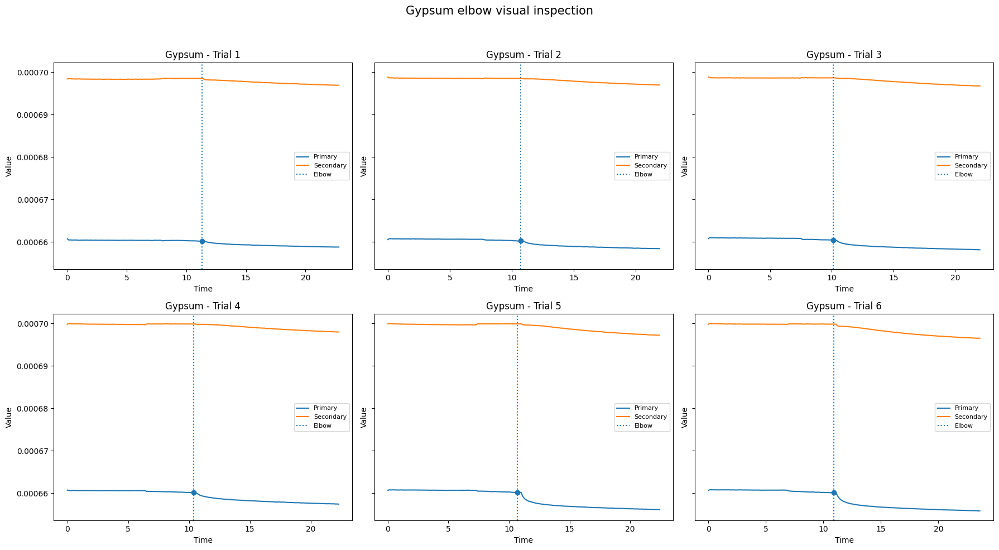

bismuth - Trial 1 - elbow index: 100.0, elbow time: 10.001
bismuth - Trial 2 - elbow index: 97.0, elbow time: 9.701
bismuth - Trial 3 - elbow index: 93.0, elbow time: 9.301
bismuth - Trial 4 - elbow index: 113.0, elbow time: 11.301
bismuth - Trial 5 - elbow index: 117.0, elbow time: 11.701
bismuth - Trial 6 - elbow index: 108.0, elbow time: 10.801


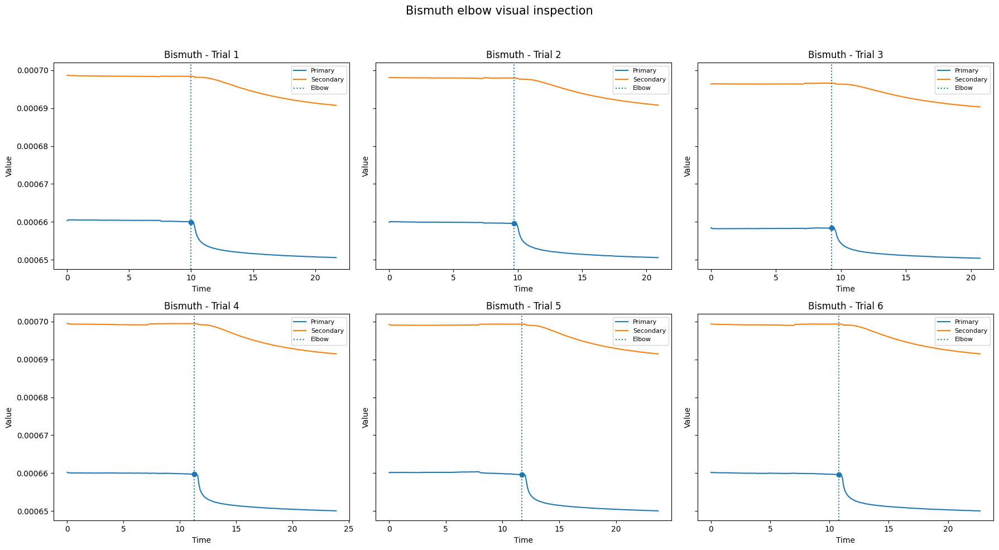

pdms - Trial 1 - elbow index: 106.0, elbow time: 10.601
pdms - Trial 2 - elbow index: 93.0, elbow time: 9.301
pdms - Trial 3 - elbow index: 85.0, elbow time: 8.501
pdms - Trial 4 - elbow index: 239.0, elbow time: 23.901
pdms - Trial 5 - elbow index: 111.0, elbow time: 11.101
pdms - Trial 6 - elbow index: 177.0, elbow time: 17.701


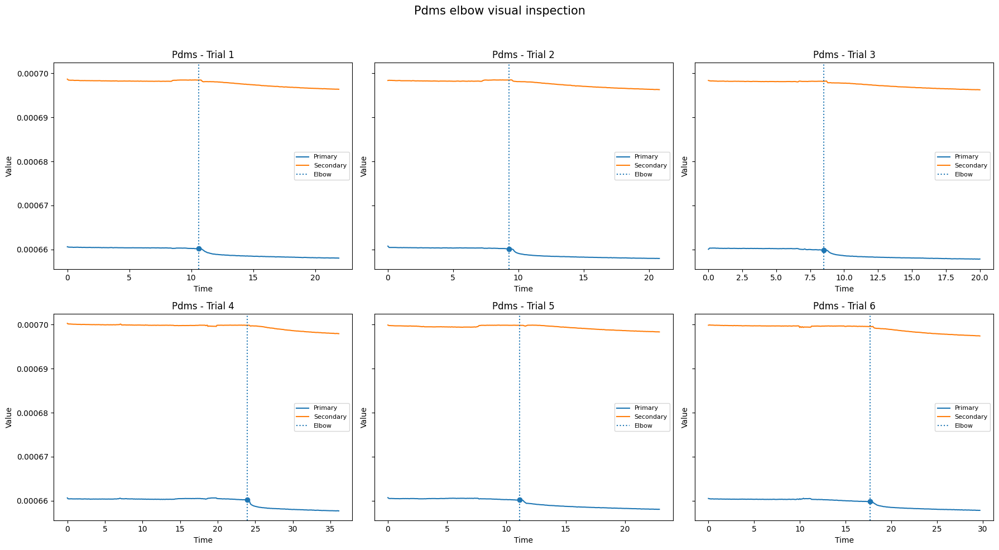

iron - Trial 1 - elbow index: 101.0, elbow time: 10.101
iron - Trial 2 - elbow index: 102.0, elbow time: 10.201
iron - Trial 3 - elbow index: 83.0, elbow time: 8.301
iron - Trial 4 - elbow index: 106.0, elbow time: 10.601
iron - Trial 5 - elbow index: 102.0, elbow time: 10.201
iron - Trial 6 - elbow index: 106.0, elbow time: 10.601


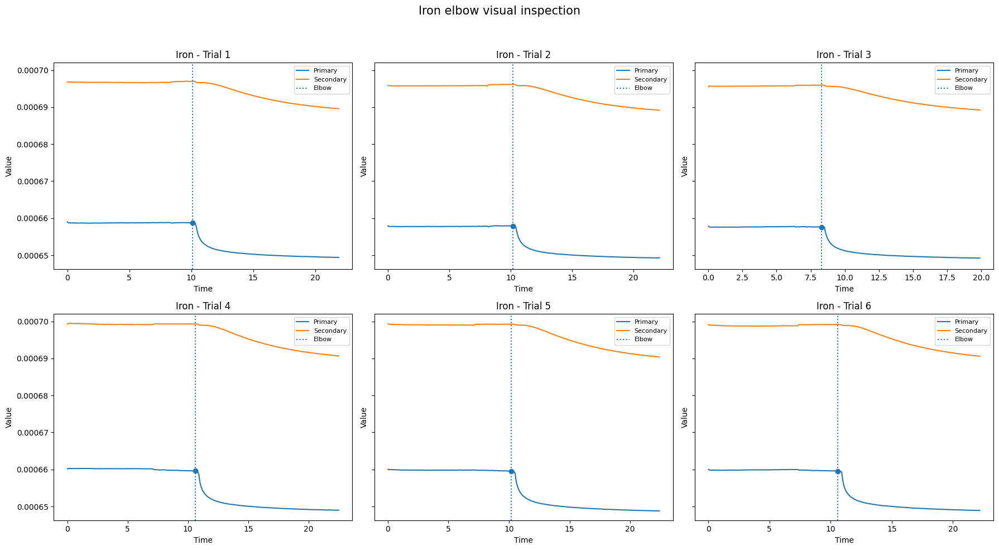

cement - Trial 1 - elbow index: 95.0, elbow time: 9.501
cement - Trial 2 - elbow index: 100.0, elbow time: 10.001
cement - Trial 3 - elbow index: 103.0, elbow time: 10.301
cement - Trial 4 - elbow index: 106.0, elbow time: 10.601
cement - Trial 5 - elbow index: 119.0, elbow time: 11.901
cement - Trial 6 - elbow index: 124.0, elbow time: 12.401


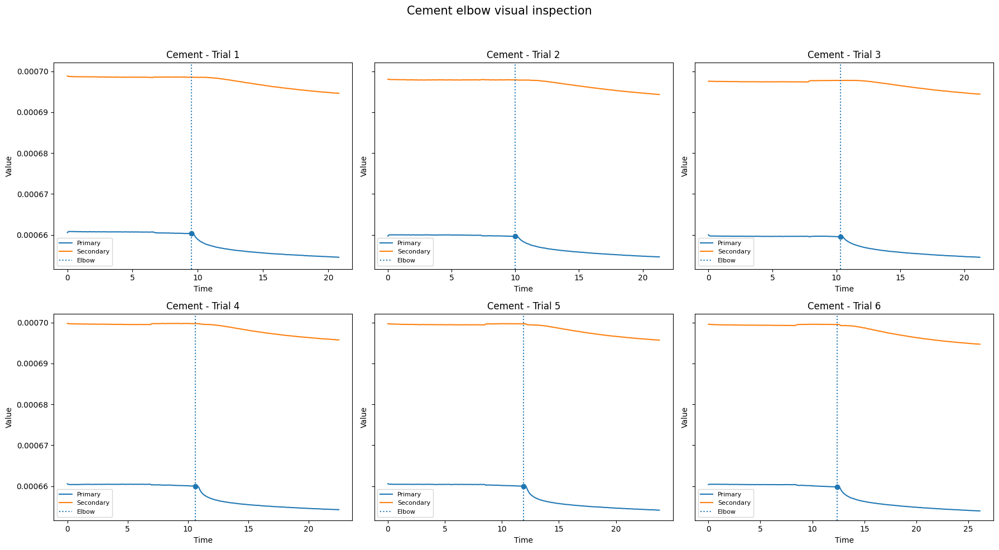

pu_foam - Trial 1 - elbow index: 101.0, elbow time: 10.101
pu_foam - Trial 2 - elbow index: 105.0, elbow time: 10.501
pu_foam - Trial 3 - elbow index: 149.0, elbow time: 14.901
pu_foam - Trial 4 - elbow index: 122.0, elbow time: 12.201
pu_foam - Trial 5 - elbow index: 80.0, elbow time: 8.001
pu_foam - Trial 6 - elbow index: 98.0, elbow time: 9.801


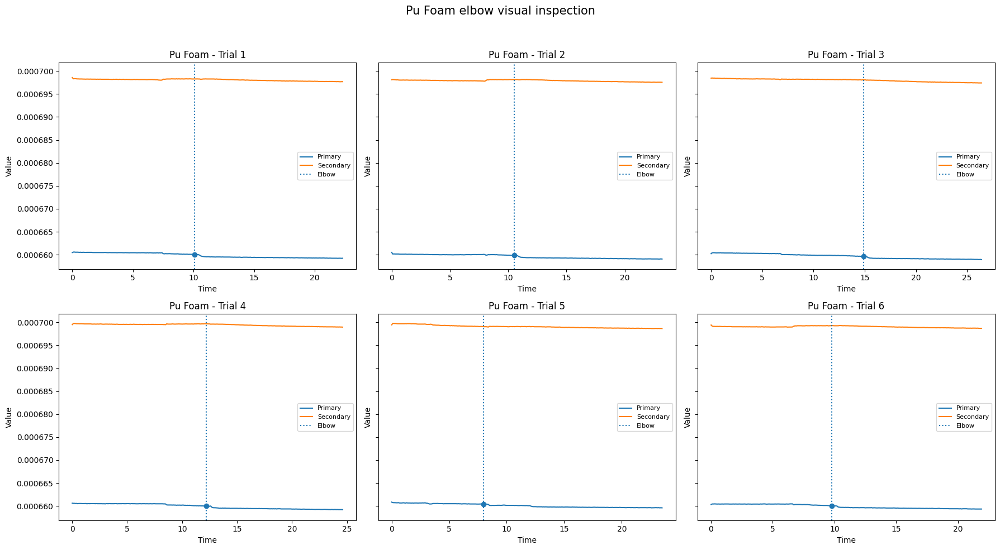

copper - Trial 1 - elbow index: 101.0, elbow time: 10.101
copper - Trial 2 - elbow index: 87.0, elbow time: 8.701
copper - Trial 3 - elbow index: 92.0, elbow time: 9.201
copper - Trial 4 - elbow index: 100.0, elbow time: 10.001
copper - Trial 5 - elbow index: 109.0, elbow time: 10.901
copper - Trial 6 - elbow index: 100.0, elbow time: 10.001


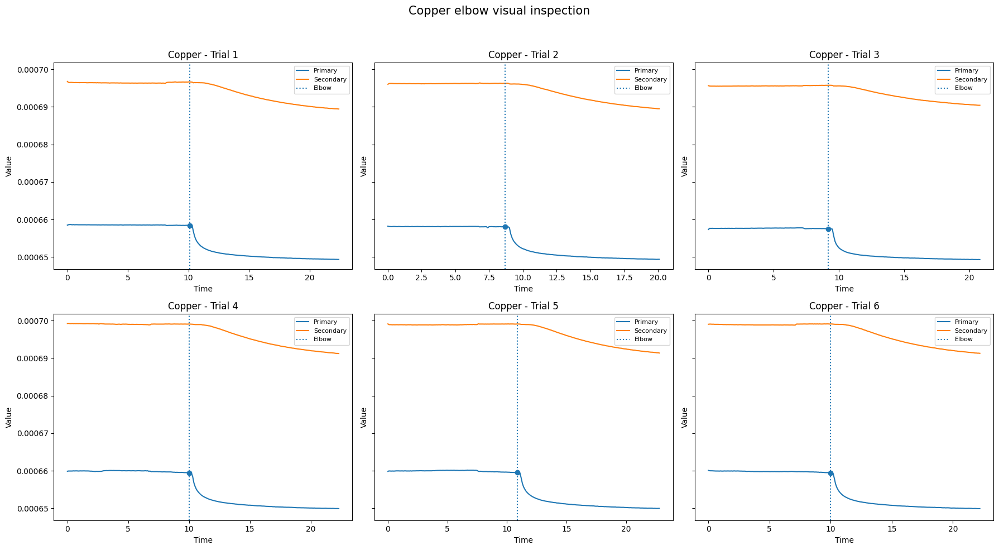

In [112]:
for material in MATERIALS:
    current_material = DATA[DATA["Sample"] == material]
    trial_numbers = sorted(current_material["Trial"].unique())

    n_cols = min(3, len(trial_numbers))
    n_rows = math.ceil(len(trial_numbers) / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(6 * n_cols, 5 * n_rows),
        sharey=True,
        squeeze=False,
    )

    axes = axes.ravel()

    for ax, trial in zip(axes, trial_numbers):
        subset = (
            current_material[current_material["Trial"].astype(int) == trial]
            .sort_values("Time")
            .copy()
        )

        elbow_time = subset["Elbow time"].iloc[0]
        elbow_value = subset["Elbow value"].iloc[0]
        elbow_idx = subset["Elbow index"].iloc[0]

        ax.plot(
            subset["Time"],
            subset["Primary"],
            label="Primary",
        )

        ax.plot(
            subset["Time"],
            subset["Secondary"],
            label="Secondary",
        )

        if np.isfinite(elbow_time):
            ax.axvline(
                elbow_time,
                linestyle=":",
                label="Elbow",
            )

            ax.scatter(
                elbow_time,
                elbow_value,
                zorder=5,
            )

        ax.set(
            title=f"{material.replace('_', ' ').title()} - Trial {trial}",
            xlabel="Time",
            ylabel="Value",
        )

        ax.legend(fontsize=8)

        print(
            f"{material} - Trial {trial} - "
            f"elbow index: {elbow_idx}, elbow time: {elbow_time:.3f}"
        )

    for ax in axes[len(trial_numbers):]:
        ax.axis("off")

    fig.suptitle(
        f"{material.replace('_', ' ').title()} elbow visual inspection",
        fontsize=15,
    )

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

## Elbow Position Normalization

In [113]:
DATA

,index,Sample,Trial,k,Mass,Volume,rho,cp,Time,Primary,Secondary,Label,eff,Elbow time,Elbow value,Elbow index
0,0,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.00930,0.000661,0.000700,foam,37.788887,11.40066,0.00066,114.0
1,1,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.10067,0.000661,0.000700,foam,37.788887,11.40066,0.00066,114.0
2,2,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.20070,0.000661,0.000700,foam,37.788887,11.40066,0.00066,114.0
3,3,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.30066,0.000661,0.000700,foam,37.788887,11.40066,0.00066,114.0
4,4,ps_foam,6,0.034,1.0,1.0,30.0,1400.0,0.40070,0.000661,0.000700,foam,37.788887,11.40066,0.00066,114.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19258,213,bismuth,1,7.920,1.0,1.0,9800.0,130.0,21.30071,0.000651,0.000691,metal,3176.488627,10.00070,0.00066,100.0
19259,214,bismuth,1,7.920,1.0,1.0,9800.0,130.0,21.40070,0.000651,0.000691,metal,3176.488627,10.00070,0.00066,100.0
19260,215,bismuth,1,7.920,1.0,1.0,9800.0,130.0,21.50066,0.000651,0.000691,metal,3176.488627,10.00070,0.00066,100.0
19261,216,bismuth,1,7.920,1.0,1.0,9800.0,130.0,21.60070,0.000651,0.000691,metal,3176.488627,10.00070,0.00066,100.0


In [114]:
DATA["Time from elbow"] = DATA["Time"] - DATA["Elbow time"]
DATA["Primary aligned"] = DATA["Primary"] - DATA["Elbow value"]
DATA["Secondary aligned"] = DATA["Secondary"] - DATA["Elbow value"]
DATA = DATA[(DATA['Time from elbow'] >= 0) & (DATA['Time from elbow'] < 5.1)]


# Feature extraction - thermal features

In [115]:
def extract_trial_features(
    trial_data,
    analysis_window=(0.0, 5.0),
    early_window=(0.0, 1.0),
    mid_window=(1.0, 3.0),
    late_window=(3.0, 5.0),
    smooth=True,
    savgol_window=11,
    savgol_polyorder=2,
    k_pdms=0.15,             # W/(m·K), approximate PDMS thermal conductivity
    pdms_thickness_m=1e-3,   # m, replace with your actual PDMS layer thickness
    contact_area_m2=1e-6,    # m², 1 mm × 1 mm
    effective_depth_m=1e-3,  # m, assumed thermal penetration depth for rho/cp features
):
    """
    Extract cleaned thermal-response features from one trial.

    Required columns
    ----------------
    Time
    Primary
    Secondary

    Optional columns
    ----------------
    rho : literature density, kg/m³
    cp  : literature specific heat capacity, J/(kg·K)

    Assumptions
    -----------
    - First row is already the detected elbow/contact onset.
    - Primary and Secondary are temperature values, or are linearly proportional to temperature.
    - Time is in seconds.
    - Primary is the top sensor.
    - Secondary is the bottom sensor.
    - difference = Primary - Secondary.
    """

    # ------------------------------------------------------------
    # Helper functions
    # ------------------------------------------------------------

    trapz = np.trapezoid if hasattr(np, "trapezoid") else np.trapz

    def make_mask(time_array, window):
        start, end = window
        return (time_array >= start) & (time_array <= end)

    def finite_first(series):
        values = pd.to_numeric(series, errors="coerce").dropna()
        if len(values) == 0:
            return np.nan
        return float(values.iloc[0])

    def safe_ratio(numerator, denominator):
        if (
            not np.isfinite(numerator)
            or not np.isfinite(denominator)
            or np.isclose(denominator, 0.0)
        ):
            return np.nan
        return float(numerator / denominator)

    def fitted_slope(time_array, signal_array, window):
        """
        Linear-fit slope within a selected time window.
        """
        mask = make_mask(time_array, window)

        valid = (
            mask
            & np.isfinite(time_array)
            & np.isfinite(signal_array)
        )

        if valid.sum() < 3:
            return np.nan

        slope, _ = np.polyfit(
            time_array[valid],
            signal_array[valid],
            deg=1,
        )

        return float(slope)

    def smooth_signal(signal):
        signal = np.asarray(signal, dtype=float)

        if not smooth:
            return signal.copy()

        window = min(int(savgol_window), len(signal))

        # Savitzky-Golay window must be odd.
        if window % 2 == 0:
            window -= 1

        minimum_window = savgol_polyorder + 2

        if minimum_window % 2 == 0:
            minimum_window += 1

        if window < minimum_window:
            return signal.copy()

        return savgol_filter(
            signal,
            window_length=window,
            polyorder=savgol_polyorder,
            mode="interp",
        )

    def extract_signal_features(name, signal, rate, time_array, result):
        """
        Extract selected 0th-order and 1st-order signal features.
        """
        baseline = float(signal[0])
        change = signal - baseline

        # 0th-order signal features
        result[f"{name}_max_change"] = float(change[-1])

        result[f"{name}_response_auc"] = float(
            trapz(
                np.abs(change),
                time_array,
            )
        )

        # 1st-order derivative features
        result[f"{name}_early_window_rate"] = fitted_slope(
            time_array,
            signal,
            early_window,
        )

        result[f"{name}_mid_window_rate"] = fitted_slope(
            time_array,
            signal,
            mid_window,
        )

        result[f"{name}_late_window_rate"] = fitted_slope(
            time_array,
            signal,
            late_window,
        )

        result[f"{name}_max_abs_rate"] = float(
            np.nanmax(np.abs(rate))
        )

        result[f"{name}_rate_auc"] = float(
            trapz(
                np.abs(rate),
                time_array,
            )
        )

        result[f"{name}_rate_std"] = (
            float(np.nanstd(rate, ddof=1))
            if len(rate) > 1
            else np.nan
        )

        return result

    # ------------------------------------------------------------
    # 1. Clean and sort trial data
    # ------------------------------------------------------------

    required_columns = ["Time", "Primary", "Secondary"]
    optional_columns = ["rho", "cp"]

    missing_columns = set(required_columns) - set(trial_data.columns)

    if missing_columns:
        raise KeyError(f"Missing columns: {sorted(missing_columns)}")

    available_columns = required_columns + [
        col for col in optional_columns
        if col in trial_data.columns
    ]

    trial_data = trial_data[available_columns].copy()

    for col in available_columns:
        trial_data[col] = pd.to_numeric(
            trial_data[col],
            errors="coerce",
        )

    # Literature property values for this trial
    rho = (
        finite_first(trial_data["rho"])
        if "rho" in trial_data.columns
        else np.nan
    )

    cp = (
        finite_first(trial_data["cp"])
        if "cp" in trial_data.columns
        else np.nan
    )

    rho_cp = (
        rho * cp
        if np.isfinite(rho) and np.isfinite(cp)
        else np.nan
    )

    trial_data = (
        trial_data
        .dropna(subset=required_columns)
        .sort_values("Time")
        .drop_duplicates(subset="Time")
        .reset_index(drop=True)
    )

    if len(trial_data) < 4:
        raise ValueError("The trial contains too few valid observations.")

    original_time = trial_data["Time"].to_numpy(dtype=float)
    primary = trial_data["Primary"].to_numpy(dtype=float)
    secondary = trial_data["Secondary"].to_numpy(dtype=float)

    if np.any(np.diff(original_time) <= 0):
        raise ValueError("Time must be strictly increasing.")

    # ------------------------------------------------------------
    # 2. Treat first row as elbow/contact onset
    # ------------------------------------------------------------

    elbow_time = float(original_time[0])
    time = original_time - elbow_time

    # ------------------------------------------------------------
    # 3. Restrict to fixed analysis window
    # ------------------------------------------------------------

    analysis_mask = make_mask(
        time,
        analysis_window,
    )

    time = time[analysis_mask]
    primary = primary[analysis_mask]
    secondary = secondary[analysis_mask]

    if len(time) < 4:
        raise ValueError("Too few observations inside analysis_window.")

    # ------------------------------------------------------------
    # 4. Smooth signals
    # ------------------------------------------------------------

    primary_smooth = smooth_signal(primary)
    secondary_smooth = smooth_signal(secondary)

    # Top-minus-bottom convention
    difference_smooth = primary_smooth - secondary_smooth

    # ------------------------------------------------------------
    # 5. First derivatives
    # ------------------------------------------------------------

    primary_rate = np.gradient(
        primary_smooth,
        time,
    )

    secondary_rate = np.gradient(
        secondary_smooth,
        time,
    )

    difference_rate = primary_rate - secondary_rate

    # ------------------------------------------------------------
    # 6. Initialize result
    # ------------------------------------------------------------

    result = {
        "elbow_time": elbow_time,
        "analysis_start": analysis_window[0],
        "analysis_end": analysis_window[1],

        # literature / geometry metadata
        "rho_lit": rho,
        "cp_lit": cp,
        "rho_cp_lit": rho_cp,
        "contact_area_m2": contact_area_m2,
        "effective_depth_m": effective_depth_m,
        "thermal_capacitance_per_area_lit": (
            rho_cp * effective_depth_m
            if np.isfinite(rho_cp)
            else np.nan
        ),
    }

    # ------------------------------------------------------------
    # 7. Primary, Secondary, and Difference signal features
    # ------------------------------------------------------------

    signals = {
        "primary": {
            "signal": primary_smooth,
            "rate": primary_rate,
        },
        "secondary": {
            "signal": secondary_smooth,
            "rate": secondary_rate,
        },
        "difference": {
            "signal": difference_smooth,
            "rate": difference_rate,
        },
    }

    for name, values in signals.items():
        result = extract_signal_features(
            name=name,
            signal=values["signal"],
            rate=values["rate"],
            time_array=time,
            result=result,
        )

    # ------------------------------------------------------------
    # 8. Secondary-to-primary rate ratios
    # ------------------------------------------------------------

    result["secondary_early_rate_ratio"] = safe_ratio(
        result["secondary_early_window_rate"],
        result["primary_early_window_rate"],
    )

    result["secondary_mid_rate_ratio"] = safe_ratio(
        result["secondary_mid_window_rate"],
        result["primary_mid_window_rate"],
    )

    result["secondary_late_rate_ratio"] = safe_ratio(
        result["secondary_late_window_rate"],
        result["primary_late_window_rate"],
    )

    result["secondary_rate_auc_ratio"] = safe_ratio(
        result["secondary_rate_auc"],
        result["primary_rate_auc"],
    )

    # ------------------------------------------------------------
    # 9. Top-bottom rate-difference features
    # ------------------------------------------------------------

    result["mean_top_bottom_rate_difference"] = float(
        np.nanmean(difference_rate)
    )

    result["max_top_bottom_rate_difference"] = float(
        np.nanmax(difference_rate)
    )

    result["max_abs_top_bottom_rate_difference"] = float(
        np.nanmax(np.abs(difference_rate))
    )

    result["top_bottom_rate_difference_auc"] = float(
        trapz(
            np.abs(difference_rate),
            time,
        )
    )

    result["top_bottom_rate_difference_std"] = (
        float(np.nanstd(difference_rate, ddof=1))
        if len(difference_rate) > 1
        else np.nan
    )

    # ------------------------------------------------------------
    # 10. PDMS heat-flux features
    # q''_PDMS = k_PDMS / L_PDMS * (T_top - T_bottom)
    # ------------------------------------------------------------

    q_pdms = (
        (k_pdms / pdms_thickness_m)
        * difference_smooth
    )

    q_pdms_rate = np.gradient(
        q_pdms,
        time,
    )

    result["q_pdms_mean"] = float(
        np.nanmean(q_pdms)
    )

    result["q_pdms_max"] = float(
        np.nanmax(q_pdms)
    )

    result["q_pdms_min"] = float(
        np.nanmin(q_pdms)
    )

    result["q_pdms_max_abs"] = float(
        np.nanmax(np.abs(q_pdms))
    )

    result["q_pdms_final"] = float(
        q_pdms[-1] - q_pdms[0]
    )

    result["q_pdms_auc"] = float(
        trapz(
            np.abs(q_pdms),
            time,
        )
    )

    result["q_pdms_early_window_rate"] = fitted_slope(
        time,
        q_pdms,
        early_window,
    )

    result["q_pdms_mid_window_rate"] = fitted_slope(
        time,
        q_pdms,
        mid_window,
    )

    result["q_pdms_late_window_rate"] = fitted_slope(
        time,
        q_pdms,
        late_window,
    )

    result["q_pdms_rate_auc"] = float(
        trapz(
            np.abs(q_pdms_rate),
            time,
        )
    )

    result["q_pdms_rate_std"] = (
        float(np.nanstd(q_pdms_rate, ddof=1))
        if len(q_pdms_rate) > 1
        else np.nan
    )

    # ------------------------------------------------------------
    # 11. Literature rho/cp-based features
    # These are reference-informed, not independently measured.
    # ------------------------------------------------------------

    if np.isfinite(rho_cp):

        # Energy density from primary temperature response:
        # u = rho * cp * ΔT
        result["primary_energy_density_max_change"] = (
            rho_cp * result["primary_max_change"]
        )

        result["primary_energy_density_response_auc"] = (
            rho_cp * result["primary_response_auc"]
        )

        # Power density from primary temperature rate:
        # p_v = rho * cp * dT/dt
        result["primary_power_density_early_window_rate"] = (
            rho_cp * result["primary_early_window_rate"]
        )

        result["primary_power_density_mid_window_rate"] = (
            rho_cp * result["primary_mid_window_rate"]
        )

        result["primary_power_density_late_window_rate"] = (
            rho_cp * result["primary_late_window_rate"]
        )

        result["primary_power_density_max_abs_rate"] = (
            rho_cp * result["primary_max_abs_rate"]
        )

        result["primary_power_density_rate_auc"] = (
            rho_cp * result["primary_rate_auc"]
        )

        # Apparent heat flux using assumed effective heated depth:
        # q''_app = rho * cp * L_eff * dT/dt
        result["primary_q_app_early_window_rate"] = (
            rho_cp
            * effective_depth_m
            * result["primary_early_window_rate"]
        )

        result["primary_q_app_mid_window_rate"] = (
            rho_cp
            * effective_depth_m
            * result["primary_mid_window_rate"]
        )

        result["primary_q_app_late_window_rate"] = (
            rho_cp
            * effective_depth_m
            * result["primary_late_window_rate"]
        )

        result["primary_q_app_max_abs_rate"] = (
            rho_cp
            * effective_depth_m
            * result["primary_max_abs_rate"]
        )

        result["primary_q_app_rate_auc"] = (
            rho_cp
            * effective_depth_m
            * result["primary_rate_auc"]
        )

    else:
        rho_cp_feature_names = [
            "primary_energy_density_max_change",
            "primary_energy_density_response_auc",
            "primary_power_density_early_window_rate",
            "primary_power_density_mid_window_rate",
            "primary_power_density_late_window_rate",
            "primary_power_density_max_abs_rate",
            "primary_power_density_rate_auc",
            "primary_q_app_early_window_rate",
            "primary_q_app_mid_window_rate",
            "primary_q_app_late_window_rate",
            "primary_q_app_max_abs_rate",
            "primary_q_app_rate_auc",
        ]

        for feature_name in rho_cp_feature_names:
            result[feature_name] = np.nan

    return pd.Series(result)

In [116]:
# ------------------------------------------------------------
# Run feature extraction
# ------------------------------------------------------------

group_columns = [
    "Sample",
    "Trial",
    "Label",
    "k",
    "eff"
]

FEATURES_THERMAL = (
    DATA
    .groupby(
        group_columns,
        dropna=False,
    )
    .apply(
        lambda trial_data: extract_trial_features(
            trial_data,
            analysis_window=(0.0, 5.0),
            early_window=(0.0, 1.0),
            mid_window=(1.0, 3.0),
            late_window=(3.0, 5.0),

            # Replace these with your actual sensor-stack values
            k_pdms=0.15,
            pdms_thickness_m=7e-4,

            # contact area: 1 mm × 1 mm
            contact_area_m2=1e-6,

            # Assumed effective thermal penetration depth
            effective_depth_m=1e-3,
        )
    )
    .reset_index()
)

FEATURES_THERMAL.head()

/var/folders/fx/p7h99klx61g3f9j63ld4_xcm0000gn/T/ipykernel_22006/4110555255.py:19: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(


,Sample,Trial,Label,k,eff,elbow_time,analysis_start,analysis_end,rho_lit,cp_lit,...,primary_power_density_early_window_rate,primary_power_density_mid_window_rate,primary_power_density_late_window_rate,primary_power_density_max_abs_rate,primary_power_density_rate_auc,primary_q_app_early_window_rate,primary_q_app_mid_window_rate,primary_q_app_late_window_rate,primary_q_app_max_abs_rate,primary_q_app_rate_auc
0,aluminum,1,metal,215.0,22819.038104,8.60066,0.0,5.0,2700.0,897.0,...,-17.779353,-2.096162,-0.633045,22.777377,22.902458,-0.017779,-0.002096,-0.000633,0.022777,0.022902
1,aluminum,2,metal,215.0,22819.038104,9.20070,0.0,5.0,2700.0,897.0,...,-13.924630,-1.907561,-0.607661,17.413090,18.791092,-0.013925,-0.001908,-0.000608,0.017413,0.018791
2,aluminum,3,metal,215.0,22819.038104,10.50070,0.0,5.0,2700.0,897.0,...,-16.180383,-1.673659,-0.512289,23.536803,20.400437,-0.016180,-0.001674,-0.000512,0.023537,0.020400
3,aluminum,4,metal,215.0,22819.038104,10.50070,0.0,5.0,2700.0,897.0,...,-19.271718,-2.366631,-0.770246,24.477556,25.091315,-0.019272,-0.002367,-0.000770,0.024478,0.025091
4,aluminum,5,metal,215.0,22819.038104,10.40066,0.0,5.0,2700.0,897.0,...,-20.308344,-2.646133,-0.814859,24.148141,25.261985,-0.020308,-0.002646,-0.000815,0.024148,0.025262


In [117]:
# ============================================================
# 1. Select the extracted features to visualize
# ============================================================

features = [
    # --------------------------------------------------------
    # Primary sensor: 0th-order and 1st-order features
    # --------------------------------------------------------
    "primary_max_change",
    "primary_response_auc",
    "primary_early_window_rate",
    "primary_mid_window_rate",
    "primary_late_window_rate",
    "primary_max_abs_rate",
    "primary_rate_auc",
    "primary_rate_std",

    # --------------------------------------------------------
    # Secondary sensor: 0th-order and 1st-order features
    # --------------------------------------------------------
    "secondary_max_change",
    "secondary_response_auc",
    "secondary_early_window_rate",
    "secondary_mid_window_rate",
    "secondary_late_window_rate",
    "secondary_max_abs_rate",
    "secondary_rate_auc",
    "secondary_rate_std",

    # --------------------------------------------------------
    # Primary - Secondary difference
    # --------------------------------------------------------
    "difference_max_change",
    "difference_response_auc",
    "difference_early_window_rate",
    "difference_mid_window_rate",
    "difference_late_window_rate",
    "difference_max_abs_rate",
    "difference_rate_auc",
    "difference_rate_std",

    # --------------------------------------------------------
    # Secondary-to-primary ratios
    # --------------------------------------------------------
    "secondary_early_rate_ratio",
    "secondary_mid_rate_ratio",
    "secondary_late_rate_ratio",
    "secondary_rate_auc_ratio",

    # --------------------------------------------------------
    # Cross-sensor derivative features
    # --------------------------------------------------------
    "mean_top_bottom_rate_difference",
    "max_top_bottom_rate_difference",
    "max_abs_top_bottom_rate_difference",
    "top_bottom_rate_difference_auc",
    "top_bottom_rate_difference_std",

    # --------------------------------------------------------
    # PDMS heat-flux features
    # q''_PDMS = k_PDMS / L_PDMS * (Primary - Secondary)
    # --------------------------------------------------------
    "q_pdms_mean",
    "q_pdms_max",
    "q_pdms_min",
    "q_pdms_max_abs",
    "q_pdms_final",
    "q_pdms_auc",
    "q_pdms_early_window_rate",
    "q_pdms_mid_window_rate",
    "q_pdms_late_window_rate",
    "q_pdms_rate_auc",
    "q_pdms_rate_std",

    # --------------------------------------------------------
    # Literature rho/cp-based primary energy-density features
    # --------------------------------------------------------
    "primary_energy_density_max_change",
    "primary_energy_density_response_auc",

    # --------------------------------------------------------
    # Literature rho/cp-based primary power-density features
    # --------------------------------------------------------
    "primary_power_density_early_window_rate",
    "primary_power_density_mid_window_rate",
    "primary_power_density_late_window_rate",
    "primary_power_density_max_abs_rate",
    "primary_power_density_rate_auc",

    # --------------------------------------------------------
    # Literature rho/cp-based apparent heat-flux features
    # --------------------------------------------------------
    "primary_q_app_early_window_rate",
    "primary_q_app_mid_window_rate",
    "primary_q_app_late_window_rate",
    "primary_q_app_max_abs_rate",
    "primary_q_app_rate_auc",
]


# Keep only features that actually exist in features_df.
# This prevents KeyError if some names were not generated.
features = [
    feature
    for feature in features
    if feature in FEATURES_THERMAL.columns
]

print(f"Number of features to plot: {len(features)}")

Number of features to plot: 56


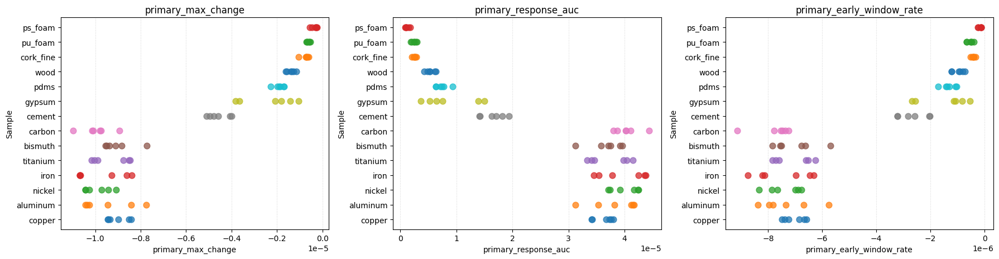

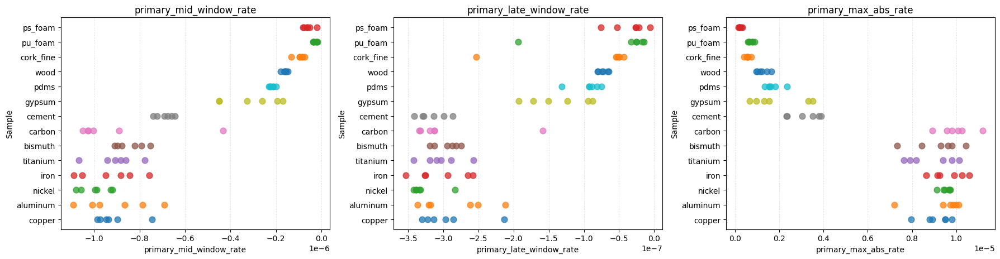

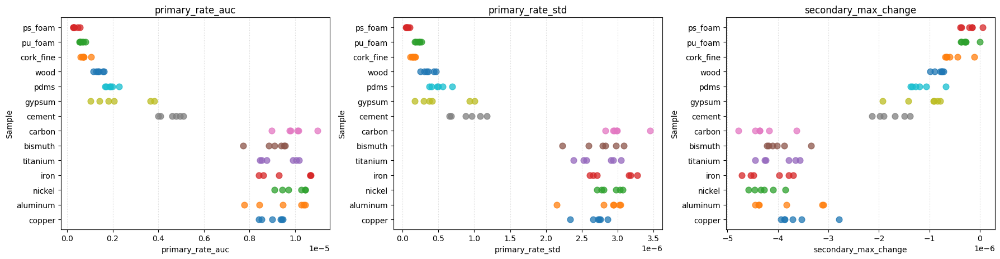

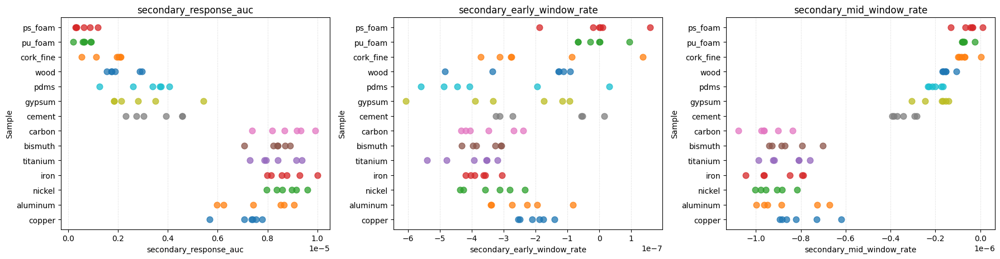

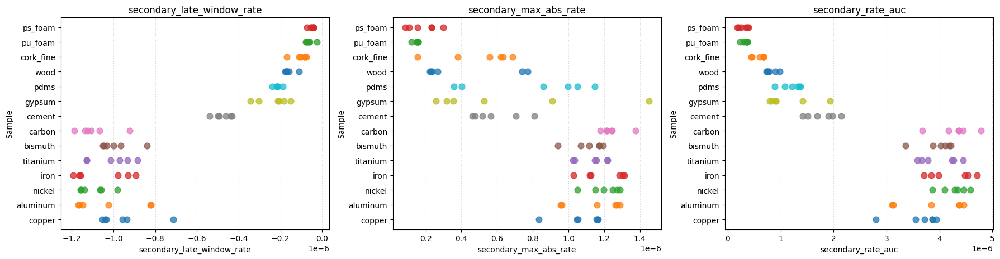

...

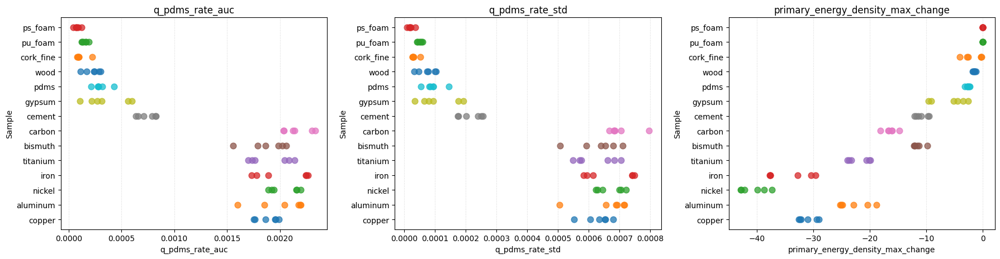

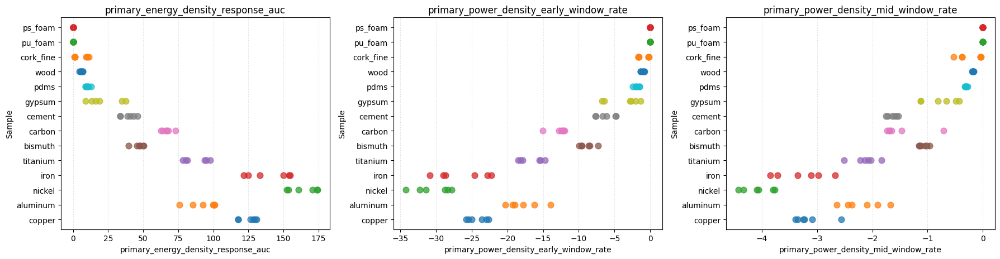

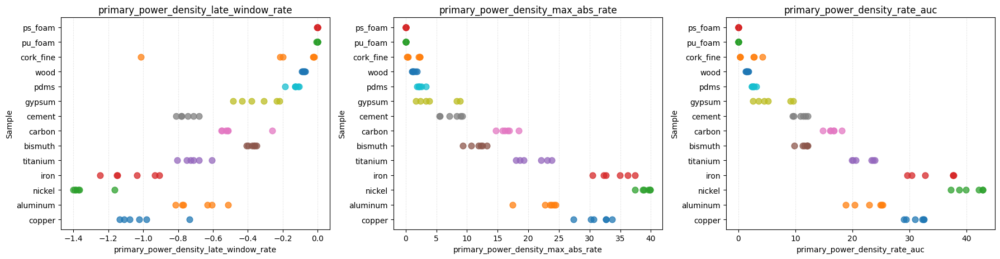

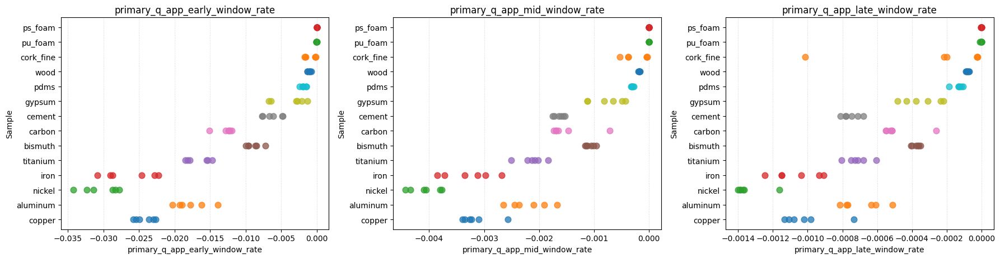

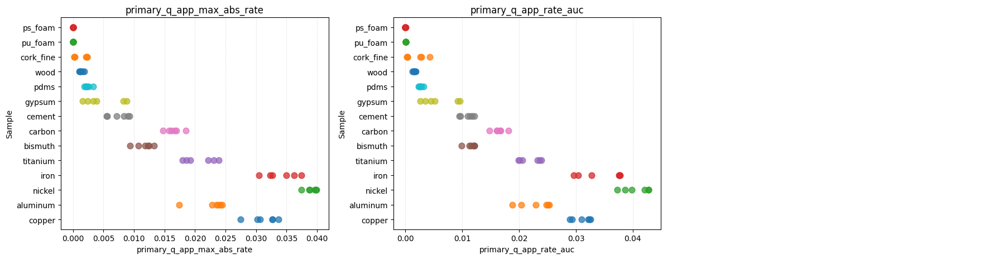

In [118]:
legend_col = "Sample"

plots_per_fig = 3
n_cols = 3
n_rows = 1

n_figures = math.ceil(
    len(features) / plots_per_fig
)

desired_order = [
    "copper",
    "aluminum",
    "nickel",
    "iron",
    "titanium",
    "bismuth",
    "carbon",
    "cement",
    "gypsum",
    "pdms",
    "wood",
    "cork_fine",
    "cork_coarse",
    "pu_foam",
    "ps_foam",
    "abrasive",      # Polyester foam
]

available_groups = (
    FEATURES_THERMAL[legend_col]
    .dropna()
    .unique()
)

groups = [
    group
    for group in desired_order
    if group in available_groups
]

# Include any samples not listed in desired_order
remaining_groups = [
    group
    for group in available_groups
    if group not in groups
]

groups.extend(remaining_groups)


for fig_num in range(n_figures):

    start = fig_num * plots_per_fig
    end = start + plots_per_fig

    current_features = features[start:end]

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 5),
    )

    axes = np.atleast_1d(axes).flatten()

    for ax, feature in zip(
        axes,
        current_features,
    ):

        for group_idx, group in enumerate(groups):

            subset = FEATURES_THERMAL[
                FEATURES_THERMAL[legend_col] == group
            ]

            values = pd.to_numeric(
                subset[feature],
                errors="coerce",
            ).dropna()

            if values.empty:
                continue

            y_position = np.full(
                len(values),
                group_idx,
                dtype=float,
            )

            # Small vertical jitter helps reveal overlapping trials
            jitter = np.random.uniform(
                0,
                0.005,
                size=len(values),
            )

            ax.scatter(
                values,
                y_position + jitter,
                label=str(group),
                alpha=0.75,
                s=60,
            )

        ax.set_yticks(
            range(len(groups))
        )

        ax.set_yticklabels(groups)

        ax.set_xlabel(feature)
        ax.set_ylabel(legend_col)
        ax.set_title(feature)

        ax.grid(
            axis="x",
            linestyle=":",
            alpha=0.5,
        )

    # Hide unused axes in the final figure
    for ax in axes[len(current_features):]:
        ax.axis("off")

    """
    fig.suptitle(
        (
            "Feature number-line plots — "
            f"Figure {fig_num + 1}"
        ),
        fontsize=16,
    )
    """

    plt.tight_layout(
        rect=[0, 0, 1, 0.95]
    )

    plt.show()

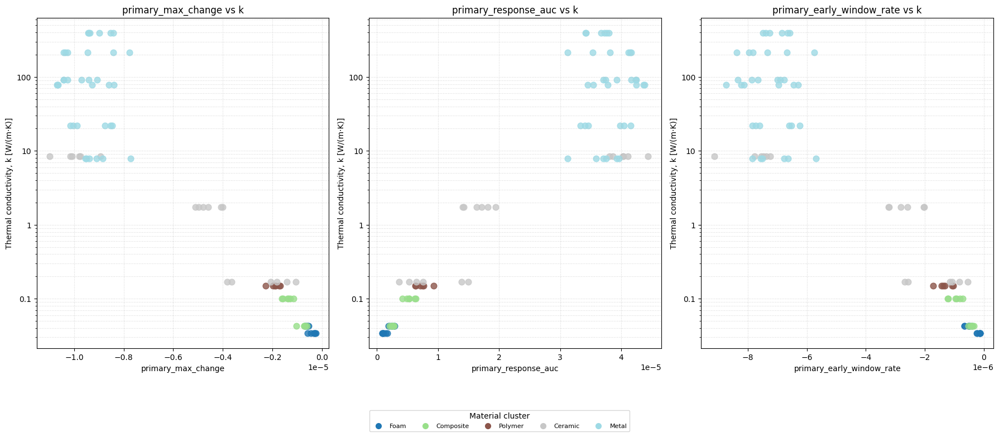

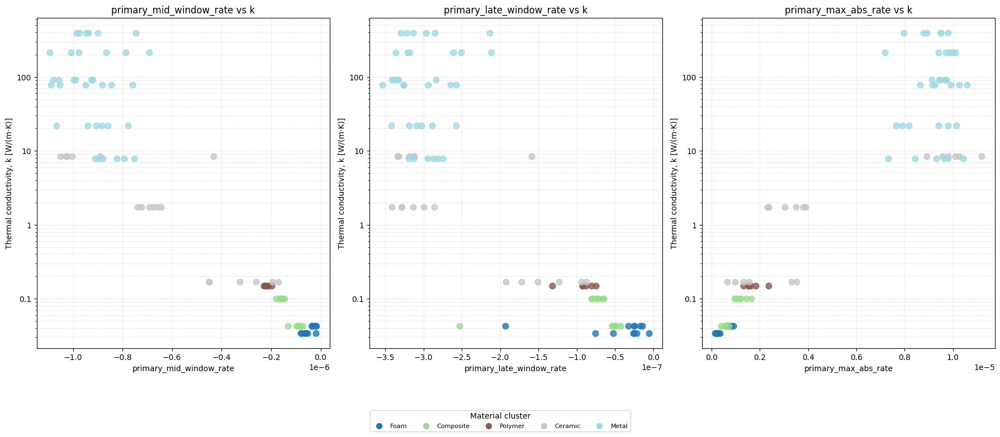

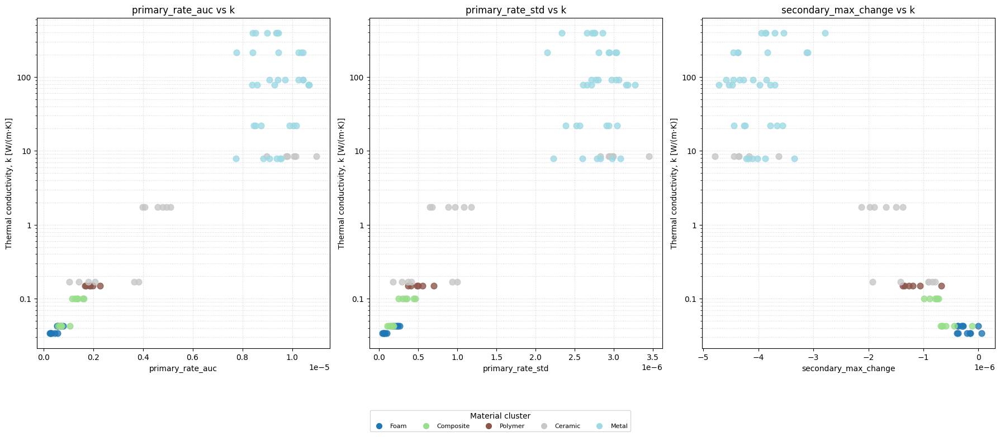

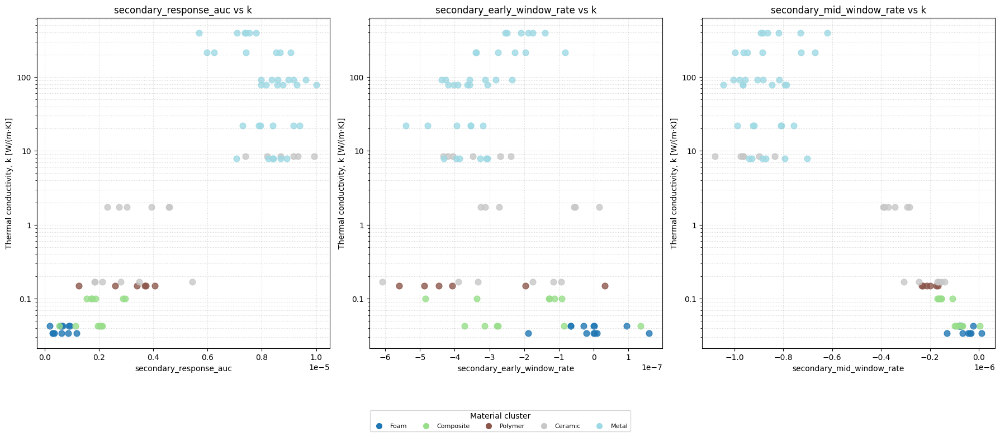

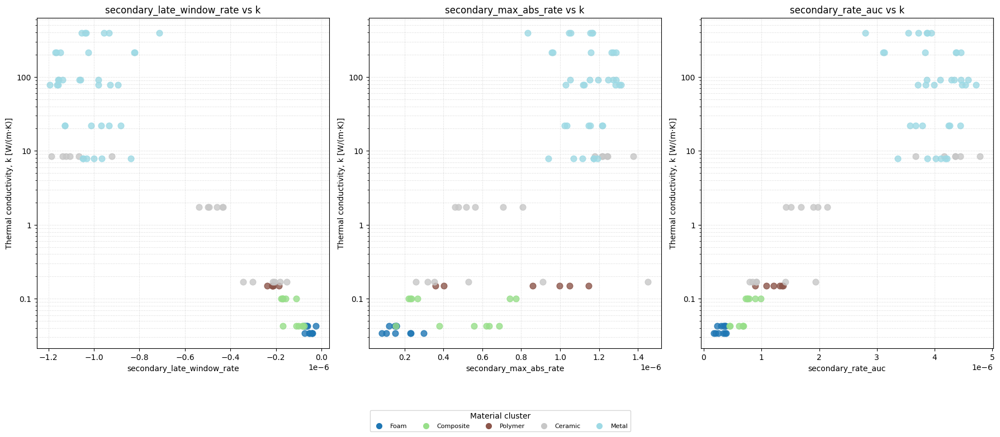

...

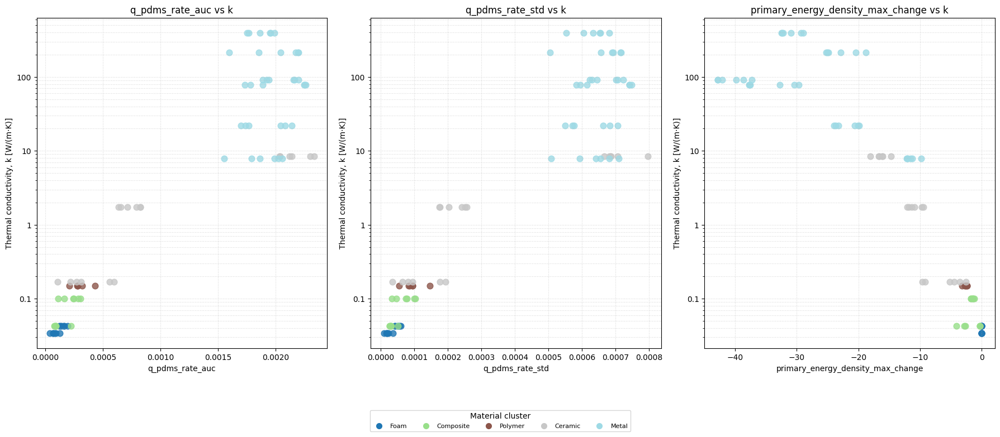

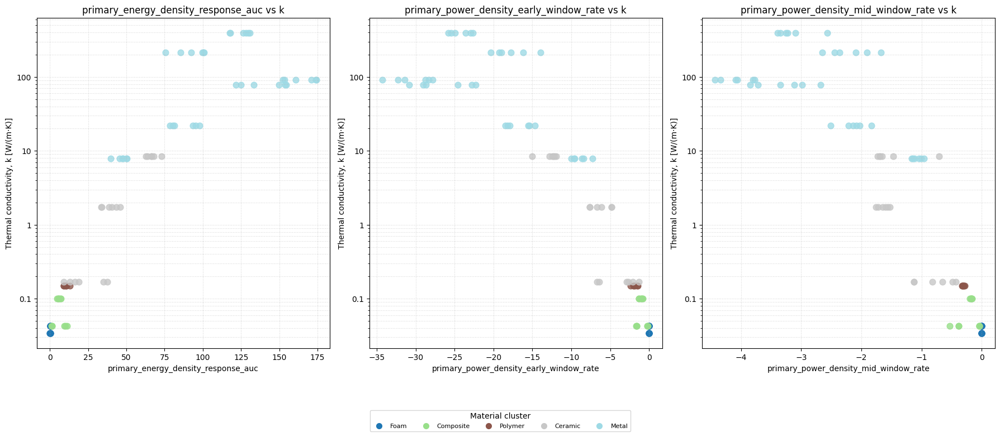

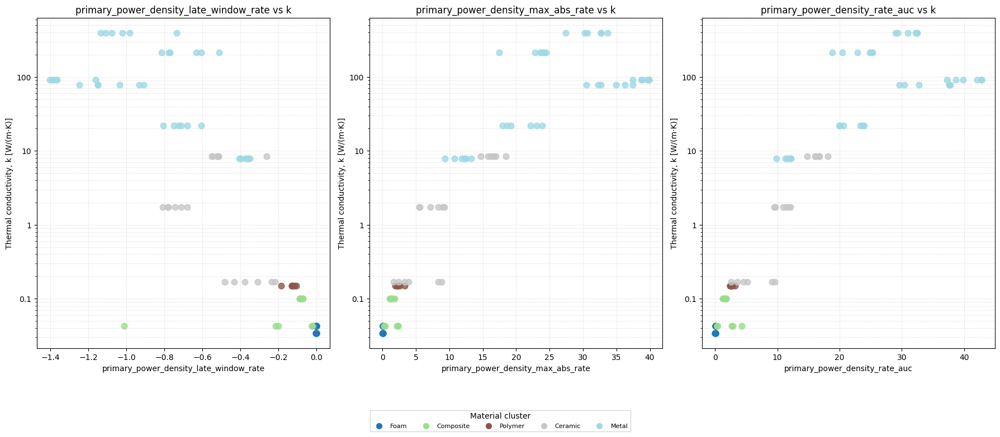

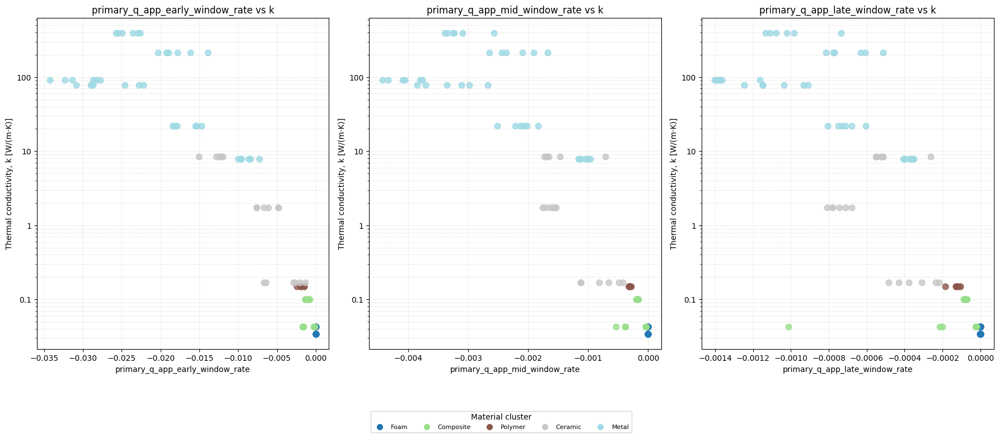

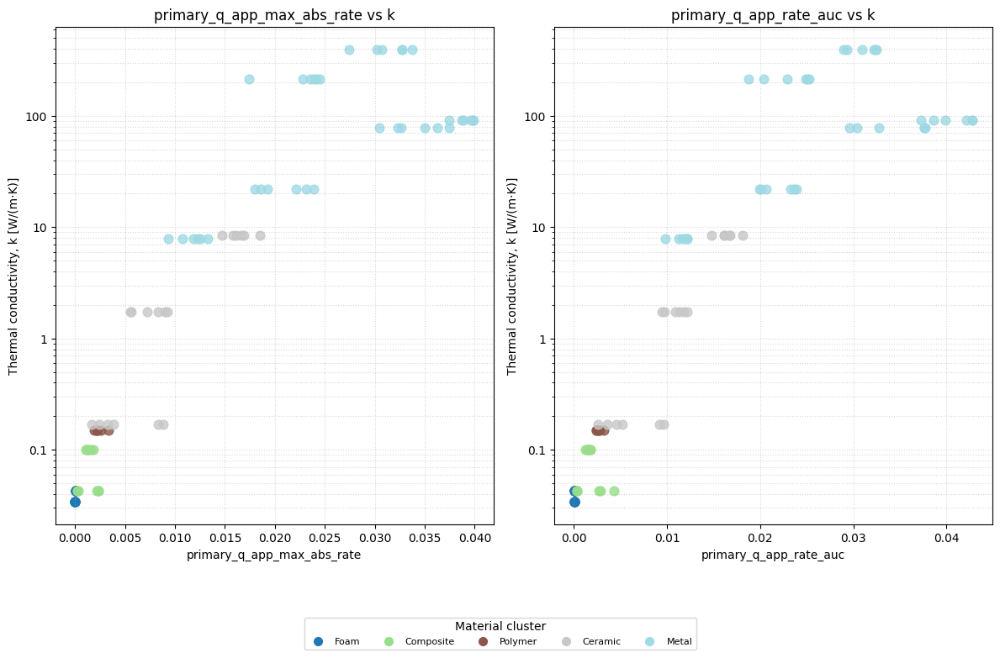

In [119]:
legend_col = "Label"
y_col = "k"
plots_per_fig = 3

# --------------------------------------------------
# Prepare plotting data
# --------------------------------------------------

plot_df = (
    FEATURES_THERMAL
    .copy()
    .replace([np.inf, -np.inf], np.nan)
)

plot_df[y_col] = pd.to_numeric(
    plot_df[y_col],
    errors="coerce"
)

# Logarithmic axes require positive values
plot_df = plot_df[
    plot_df[y_col] > 0
].copy()


# --------------------------------------------------
# Keep features containing valid numeric values
# --------------------------------------------------

valid_features = []

for feature in features:

    if feature not in plot_df.columns:
        print(f"Missing feature: {feature}")
        continue

    plot_df[feature] = pd.to_numeric(
        plot_df[feature],
        errors="coerce"
    )

    if plot_df[[feature, y_col]].dropna().empty:
        print(f"No valid numeric values: {feature}")
        continue

    valid_features.append(feature)


# --------------------------------------------------
# Order labels automatically by median k
# --------------------------------------------------

groups = (
    plot_df
    .dropna(subset=[legend_col])
    .groupby(legend_col)[y_col]
    .median()
    .sort_values()
    .index
    .tolist()
)


# --------------------------------------------------
# Assign one consistent color to each label
# --------------------------------------------------

cmap = plt.get_cmap(
    "tab20",
    len(groups)
)

group_colors = {
    group: cmap(i)
    for i, group in enumerate(groups)
}


# --------------------------------------------------
# Create plots
# --------------------------------------------------

n_figures = math.ceil(
    len(valid_features) / plots_per_fig
)

for fig_num in range(n_figures):

    current_features = valid_features[
        fig_num * plots_per_fig:
        (fig_num + 1) * plots_per_fig
    ]

    n_current = len(current_features)

    fig, axes = plt.subplots(
        1,
        n_current,
        figsize=(6 * n_current, 8),
        squeeze=False
    )

    axes = axes.ravel()

    for ax, feature in zip(
        axes,
        current_features
    ):

        for group in groups:

            subset = plot_df[
                plot_df[legend_col] == group
            ].dropna(
                subset=[feature, y_col]
            )

            if subset.empty:
                continue

            ax.scatter(
                subset[feature],
                subset[y_col],
                color=group_colors[group],
                alpha=0.8,
                s=60
            )

        ax.set_xlabel(feature)

        ax.set_ylabel(
            "Thermal conductivity, k [W/(m·K)]"
        )

        ax.set_title(
            f"{feature} vs k"
        )

        # Logarithmic numeric y-axis
        ax.set_yscale("log")

        # Major ticks at powers of 10
        ax.yaxis.set_major_locator(
            LogLocator(base=10)
        )

        # Display 0.01, 0.1, 1, 10, 100 instead of scientific notation
        ax.yaxis.set_major_formatter(
            FuncFormatter(
                lambda value, position: f"{value:g}"
            )
        )

        ax.grid(
            which="both",
            linestyle=":",
            alpha=0.5
        )


    # --------------------------------------------------
    # Shared legend
    # --------------------------------------------------

    legend_handles = [
        Line2D(
            [0],
            [0],
            marker="o",
            linestyle="",
            markerfacecolor=group_colors[group],
            markeredgecolor=group_colors[group],
            markersize=7,
            label=str(group).replace("_", " ").title()
        )
        for group in groups
    ]

    fig.legend(
        handles=legend_handles,
        title="Material cluster",
        loc="lower center",
        bbox_to_anchor=(0.5, 0.02),
        ncol=min(8, len(groups)),
        fontsize=8
    )

    plt.tight_layout(
        rect=[0, 0.14, 1, 1]
    )

    plt.show()

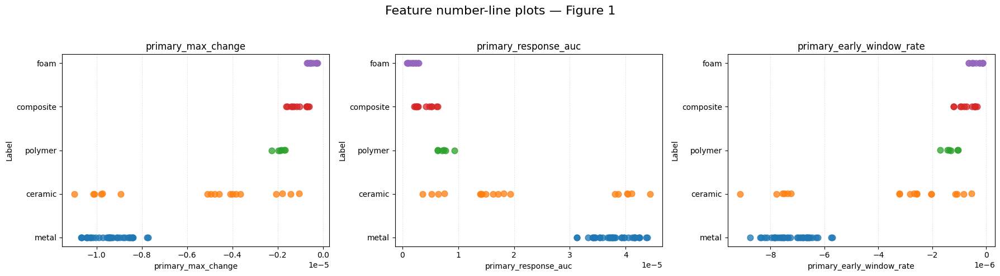

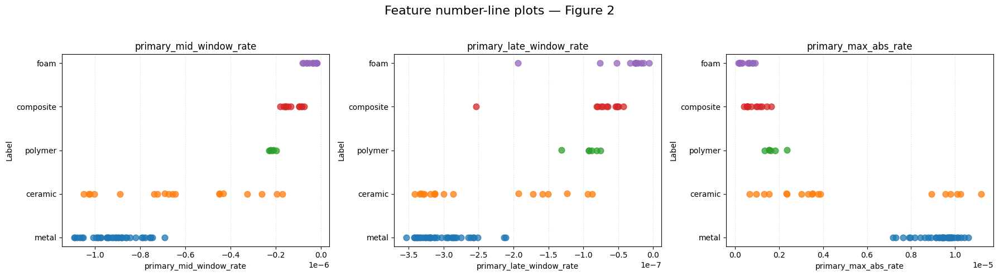

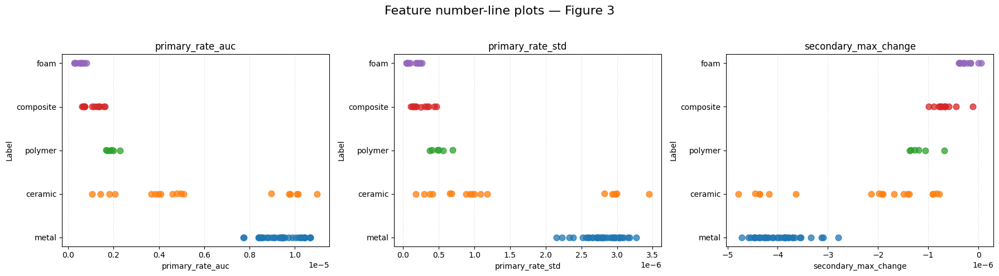

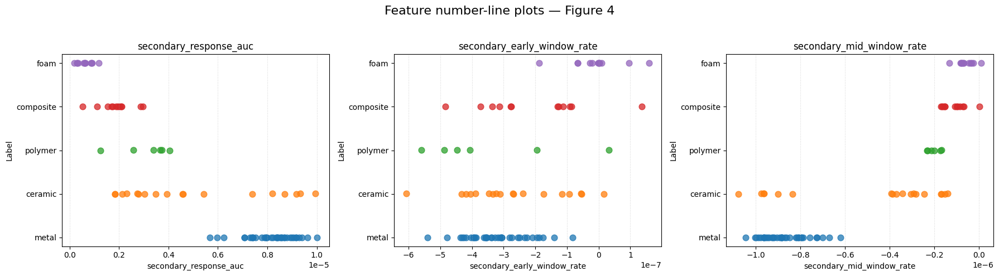

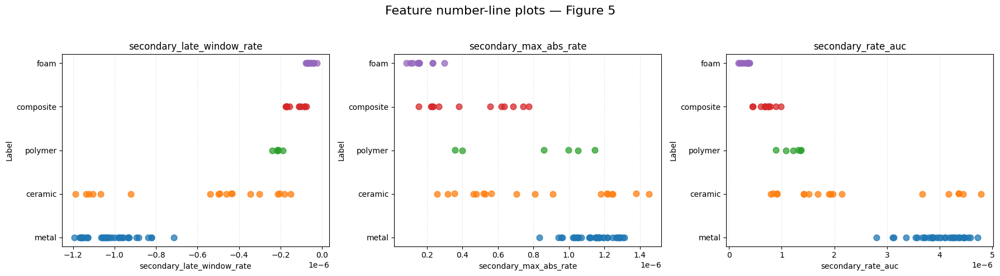

...

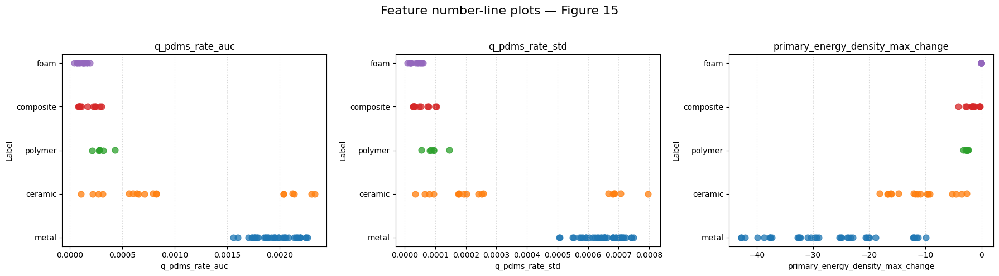

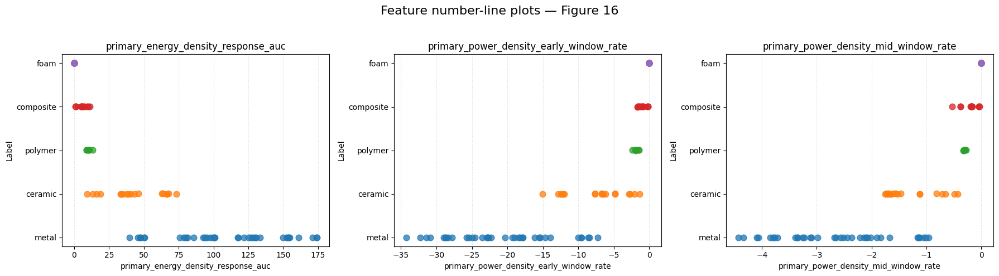

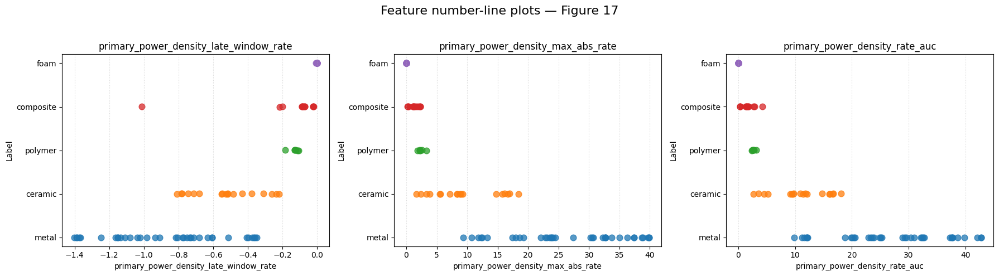

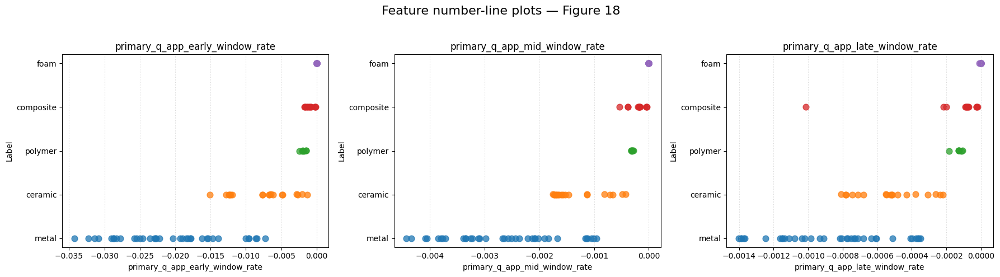

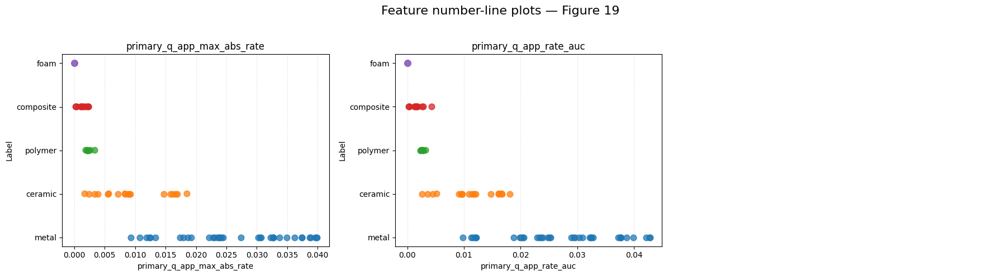

In [120]:
legend_col = "Label"

plots_per_fig = 3
n_cols = 3
n_rows = 1

n_figures = math.ceil(
    len(features) / plots_per_fig
)

desired_order = [
    'metal'
    ,'ceramic'
    ,'polymer'
    ,'composite'
]

available_groups = (
    FEATURES_THERMAL[legend_col]
    .dropna()
    .unique()
)

groups = [
    group
    for group in desired_order
    if group in available_groups
]

# Include any samples not listed in desired_order
remaining_groups = [
    group
    for group in available_groups
    if group not in groups
]

groups.extend(remaining_groups)


for fig_num in range(n_figures):

    start = fig_num * plots_per_fig
    end = start + plots_per_fig

    current_features = features[start:end]

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 5),
    )

    axes = np.atleast_1d(axes).flatten()

    for ax, feature in zip(
        axes,
        current_features,
    ):

        for group_idx, group in enumerate(groups):

            subset = FEATURES_THERMAL[
                FEATURES_THERMAL[legend_col] == group
            ]

            values = pd.to_numeric(
                subset[feature],
                errors="coerce",
            ).dropna()

            if values.empty:
                continue

            y_position = np.full(
                len(values),
                group_idx,
                dtype=float,
            )

            # Small vertical jitter helps reveal overlapping trials
            jitter = np.random.uniform(
                0,
                0.005,
                size=len(values),
            )

            ax.scatter(
                values,
                y_position + jitter,
                label=str(group),
                alpha=0.75,
                s=60,
            )

        ax.set_yticks(
            range(len(groups))
        )

        ax.set_yticklabels(groups)

        ax.set_xlabel(feature)
        ax.set_ylabel(legend_col)
        ax.set_title(feature)

        ax.grid(
            axis="x",
            linestyle=":",
            alpha=0.5,
        )

    # Hide unused axes in the final figure
    for ax in axes[len(current_features):]:
        ax.axis("off")

    fig.suptitle(
        (
            "Feature number-line plots — "
            f"Figure {fig_num + 1}"
        ),
        fontsize=16,
    )

    plt.tight_layout(
        rect=[0, 0, 1, 0.95]
    )

    plt.show()

# Feature Extraction - `tsfresh` 

In [121]:
_basic = [
    "mean", "median", "minimum", "maximum", "absolute_maximum"
]

_variability = [
    "standard_deviation", "variance", "root_mean_square",
    "mean_abs_change", "mean_change"
]

_distribution = ["skewness", "kurtosis"]
_energy = ["abs_energy", "sum_values"]
_counts = ["count_above_mean", "count_below_mean"]
_strikes = ["longest_strike_above_mean", "longest_strike_below_mean"]

_linear_trend = [
    {"attr": attr}
    for attr in ("slope", "intercept", "rvalue", "pvalue", "stderr")
]

_autocorr = [
    {"lag": lag}
    for lag in (1, 2, 5, 10)
]

_change_quantiles = [
    {"ql": 0.0, "qh": 0.2, "isabs": False, "f_agg": "mean"},
    {"ql": 0.0, "qh": 0.2, "isabs": True,  "f_agg": "mean"},
    {"ql": 0.8, "qh": 1.0, "isabs": False, "f_agg": "mean"},
    {"ql": 0.8, "qh": 1.0, "isabs": True,  "f_agg": "mean"},
]

_cid_ce = [
    {"normalize": True},
    {"normalize": False},
]

settings = {
    feature_name: None
    for feature_name in (
        _basic
        + _variability
        + _distribution
        + _energy
        + _counts
        + _strikes
    )
}

settings.update({
    "linear_trend": _linear_trend,
    "autocorrelation": _autocorr,
    "change_quantiles": _change_quantiles,
    "cid_ce": _cid_ce,
})

In [122]:
DATA['diff'] = DATA['Secondary'] - DATA['Primary']

/var/folders/fx/p7h99klx61g3f9j63ld4_xcm0000gn/T/ipykernel_22006/859437190.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  DATA['diff'] = DATA['Secondary'] - DATA['Primary']


In [123]:
# use only filtered data
ts_data = DATA.copy()

# create one ID per material-trial
ts_data["id"] = (
    ts_data["Sample"].astype(str) +
    "_trial_" +
    ts_data["Trial"].astype(int).astype(str)
)

# primary sensor table
primary = ts_data[[
    "id",
    "Time",
    "Primary",
    "k",
    "eff"
]].copy()

primary = primary.rename(columns={
    "Time": "time",
    "Primary": "value"
})

primary["kind"] = "Primary"

# secondary sensor table
secondary = ts_data[[
    "id",
    "Time",
    "Secondary"
]].copy()

secondary = secondary.rename(columns={
    "Time": "time",
    "Secondary": "value"
})

secondary["kind"] = "Secondary"


# diff sensor table
diff = ts_data[[
    "id",
    "Time",
    "diff"
]].copy()

diff = diff.rename(columns={
    "Time": "time",
    "diff": "value"
})

diff["kind"] = "Difference"

# combine primary and secondary
tsfresh_input = pd.concat(
    [primary, secondary, diff],
    ignore_index=True
)

tsfresh_input = tsfresh_input[[
    "id",
    "time",
    "kind",
    "value",
    "k"
]]

# clean invalid values
tsfresh_input = tsfresh_input.replace([np.inf, -np.inf], np.nan)
tsfresh_input = tsfresh_input.dropna()

In [124]:
FEATURES_TSFRESH = extract_features(
    tsfresh_input,
    column_id="id",
    column_sort="time",
    column_kind="kind",
    column_value="value",
    default_fc_parameters=settings,
    n_jobs=0
)

Feature Extraction: 100%|██████████| 84/84 [00:00<00:00, 522.61it/s]


In [125]:
labels = (
    ts_data[["id", "Sample", "Trial", "Label", "eff"]]
    .drop_duplicates()
    .set_index("id")
)
FEATURES_TSFRESH = FEATURES_TSFRESH.dropna(axis=1)


FEATURES_TSFRESH = FEATURES_TSFRESH.join(labels)
FEATURES_TSFRESH = FEATURES_TSFRESH.reset_index()
#FEATURES_TSFRESH = FEATURES_TSFRESH.join(ts)
FEATURES_TSFRESH.head()

,index,Primary__mean,Primary__median,Primary__minimum,Primary__maximum,Primary__absolute_maximum,Primary__standard_deviation,Primary__variance,Primary__root_mean_square,Primary__mean_abs_change,...,"Primary__change_quantiles__f_agg_""mean""__isabs_False__qh_0.2__ql_0.0","Primary__change_quantiles__f_agg_""mean""__isabs_True__qh_0.2__ql_0.0","Primary__change_quantiles__f_agg_""mean""__isabs_False__qh_1.0__ql_0.8","Primary__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.8",Primary__cid_ce__normalize_True,Primary__cid_ce__normalize_False,Sample,Trial,Label,eff
0,aluminum_trial_1,0.000652,0.000651,0.00065,0.000659,0.000659,0.000002,5.352376e-12,0.000652,1.728000e-07,...,-2.200000e-08,2.200000e-08,-6.180000e-07,6.180000e-07,1.124094,0.000003,aluminum,1,metal,22819.038104
1,aluminum_trial_2,0.000652,0.000651,0.00065,0.000657,0.000657,0.000002,3.911896e-12,0.000652,1.424000e-07,...,-2.000000e-08,2.000000e-08,-4.780000e-07,4.780000e-07,1.049505,0.000002,aluminum,2,metal,22819.038104
2,aluminum_trial_3,0.000652,0.000651,0.00065,0.000658,0.000658,0.000002,3.900150e-12,0.000652,1.505882e-07,...,-1.600000e-08,2.000000e-08,-5.660000e-07,5.660000e-07,1.226771,0.000002,aluminum,3,metal,22819.038104
3,aluminum_trial_4,0.000652,0.000651,0.00065,0.000660,0.000660,0.000003,6.900908e-12,0.000652,1.870588e-07,...,-2.400000e-08,2.400000e-08,-6.580000e-07,6.580000e-07,1.152288,0.000003,aluminum,4,metal,22819.038104
4,aluminum_trial_5,0.000652,0.000651,0.00065,0.000660,0.000660,0.000003,6.943235e-12,0.000652,1.916000e-07,...,-3.000000e-08,3.000000e-08,-6.620000e-07,6.620000e-07,1.138899,0.000003,aluminum,5,metal,22819.038104


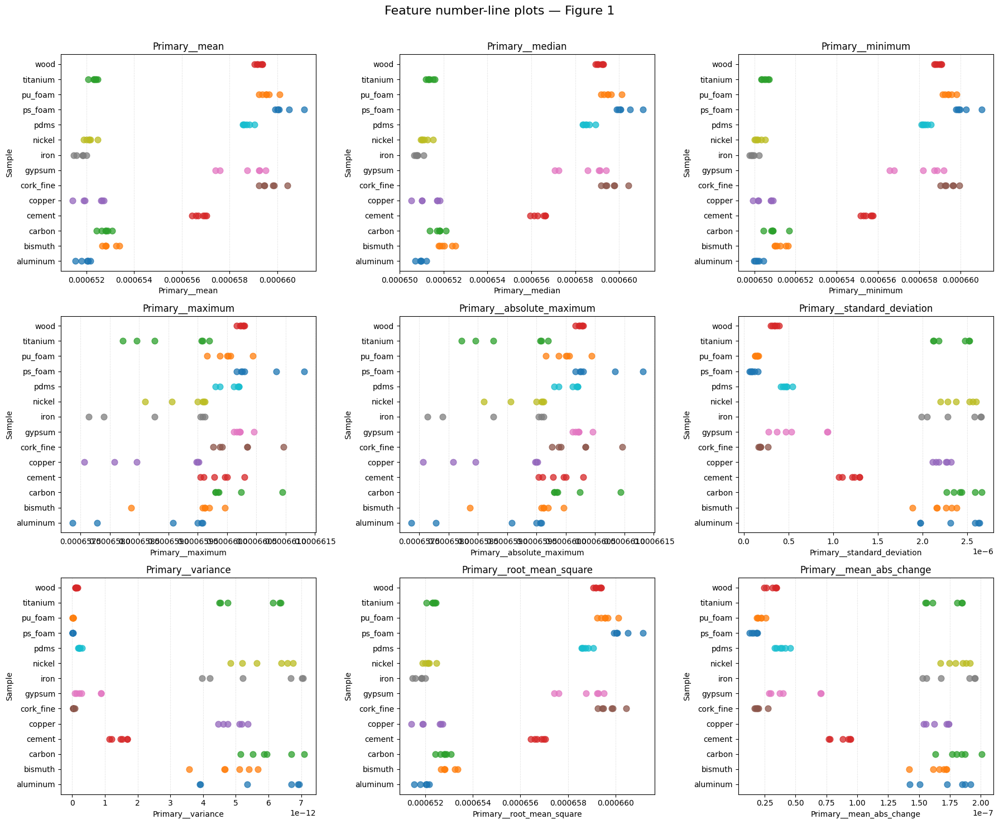

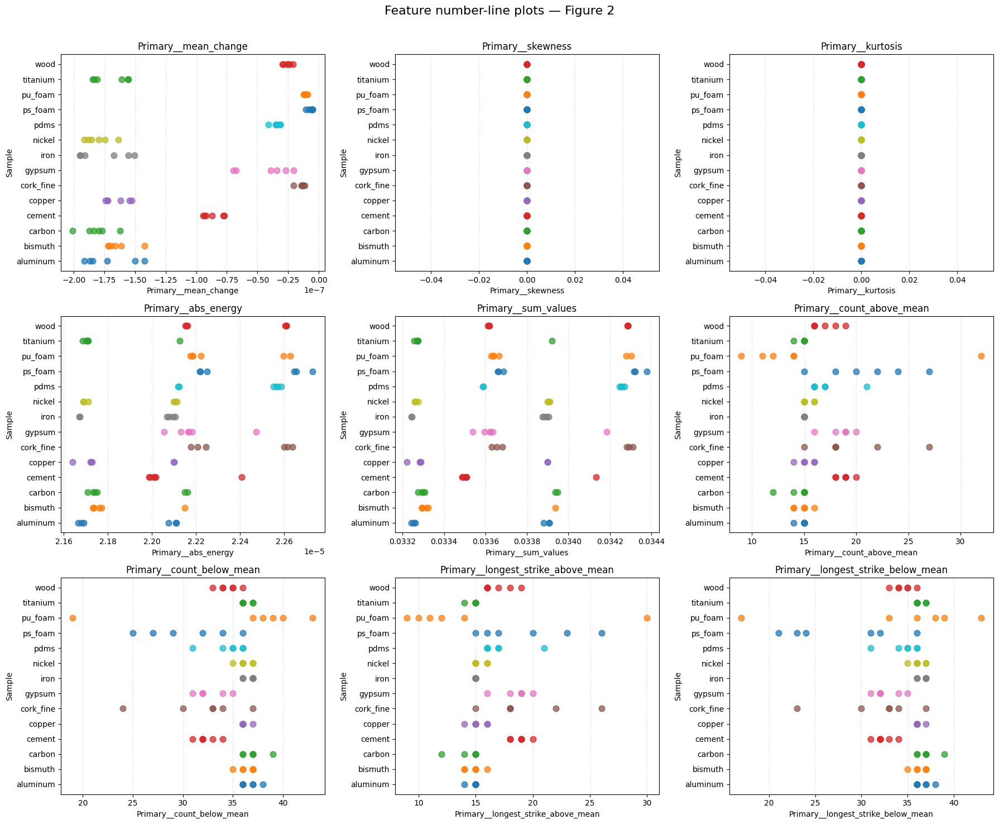

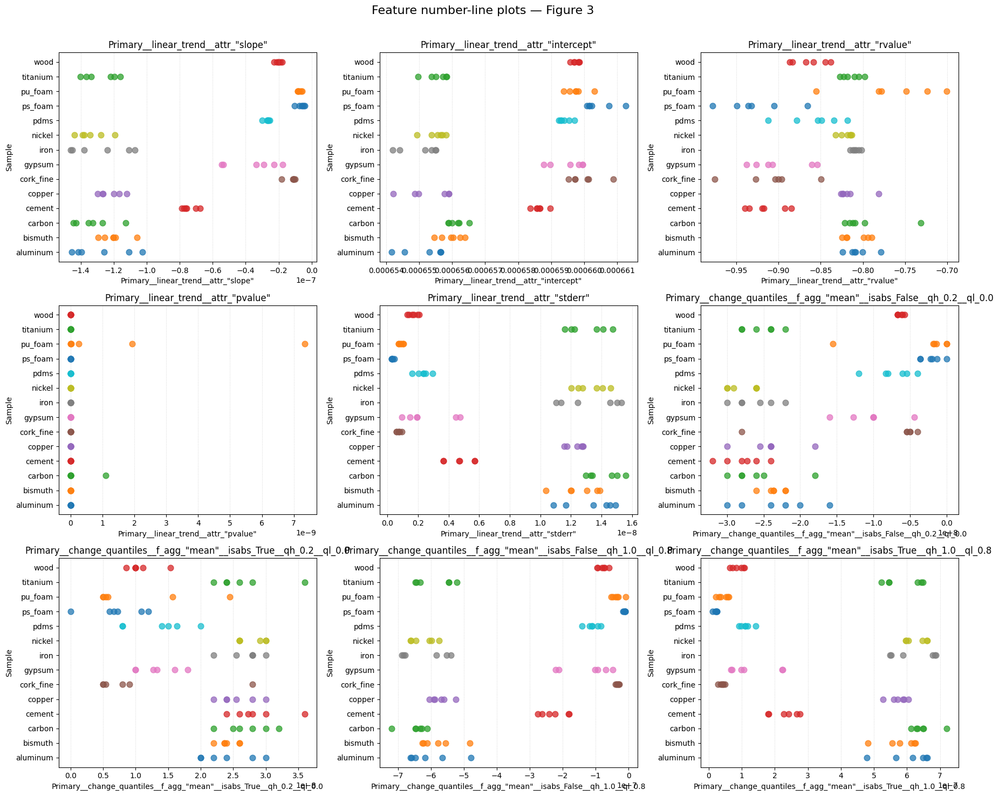

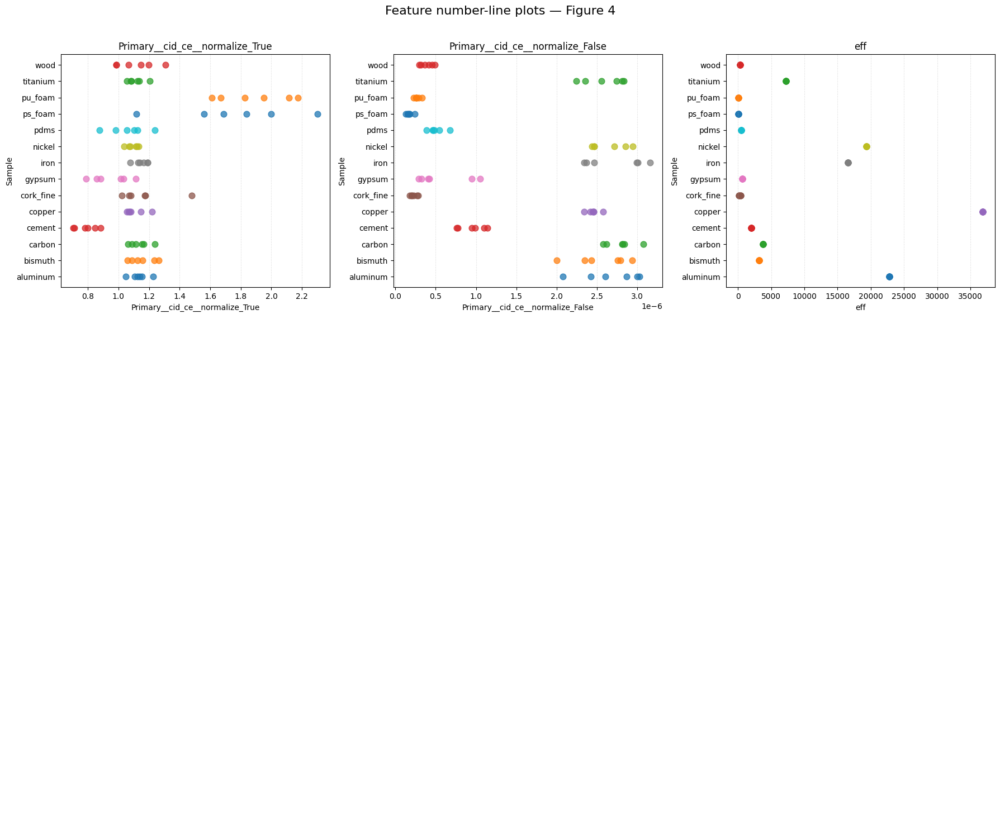

In [126]:
# -index ; - trial

legend_col = "Sample"

# Automatically select numeric features,
# excluding identifiers and elbow_time
excluded_cols = ["Sample", "Trial", "index"]

features = [
    col
    for col in FEATURES_TSFRESH.select_dtypes(include=np.number).columns
    if col not in excluded_cols
]

plots_per_fig = 9
n_cols = 3
n_rows = 3

n_figures = math.ceil(len(features) / plots_per_fig)

# Keep the same sample order in every subplot
groups = FEATURES_TSFRESH[legend_col].dropna().unique()

for fig_num in range(n_figures):

    start = fig_num * plots_per_fig
    end = start + plots_per_fig
    current_features = features[start:end]

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 15)
    )

    axes = axes.flatten()

    for ax, feature in zip(axes, current_features):

        for group_idx, group in enumerate(groups):

            subset = FEATURES_TSFRESH[
                FEATURES_TSFRESH[legend_col] == group
            ]

            # Convert to numeric and remove NaN values
            values = pd.to_numeric(
                subset[feature],
                errors="coerce"
            ).dropna()

            # Place every sample on its own horizontal level
            y_position = np.full(
                len(values),
                group_idx
            )

            ax.scatter(
                values,
                y_position,
                label=str(group),
                alpha=0.75,
                s=60
            )

        ax.set_yticks(range(len(groups)))
        ax.set_yticklabels(groups)

        ax.set_xlabel(feature)
        ax.set_ylabel(legend_col)
        ax.set_title(feature)

        ax.grid(
            axis="x",
            linestyle=":",
            alpha=0.5
        )

    # Hide unused plots in the final figure
    for ax in axes[len(current_features):]:
        ax.axis("off")

    fig.suptitle(
        f"Feature number-line plots — Figure {fig_num + 1}",
        fontsize=16
    )

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

In [127]:
# Create lookup table for thermal conductivity
k_lookup = (
    DATA[["Sample", "k"]]
    .dropna(subset=["Sample", "k"])
    .drop_duplicates(subset=["Sample"])
)

# Remove old k column if it exists
FEATURES_TSFRESH = FEATURES_TSFRESH.drop(
    columns=["k"],
    errors="ignore"
)

# Merge k into FEATURES_TSFRESH
FEATURES_TSFRESH = FEATURES_TSFRESH.merge(
    k_lookup,
    on="Sample",
    how="left",
    validate="many_to_one"
)

# Check if k was successfully added
print(FEATURES_TSFRESH[["Sample", "k"]].drop_duplicates())

       Sample        k
0    aluminum  215.000
6     bismuth    7.920
12     carbon    8.500
18     cement    1.730
24     copper  395.000
30  cork_fine    0.043
36     gypsum    0.170
42       iron   77.500
48     nickel   90.900
54       pdms    0.150
60    ps_foam    0.034
66    pu_foam    0.043
72   titanium   21.900
78       wood    0.100


Features retained: 30
Features removed because of NaN: 0


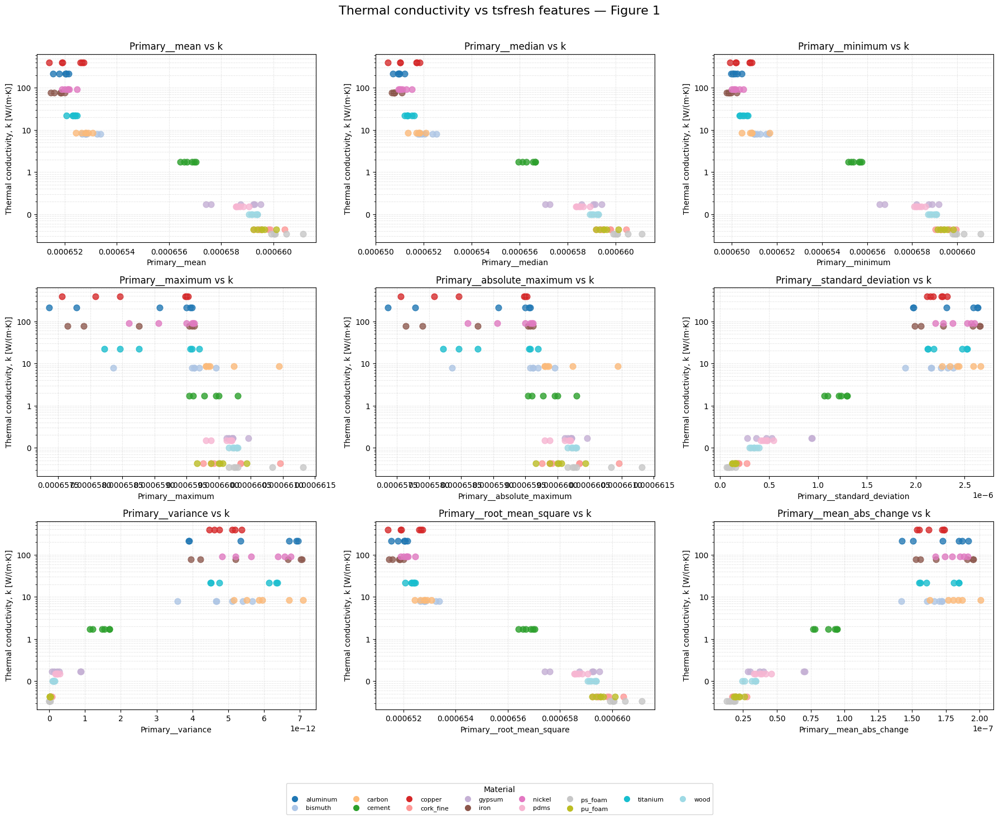

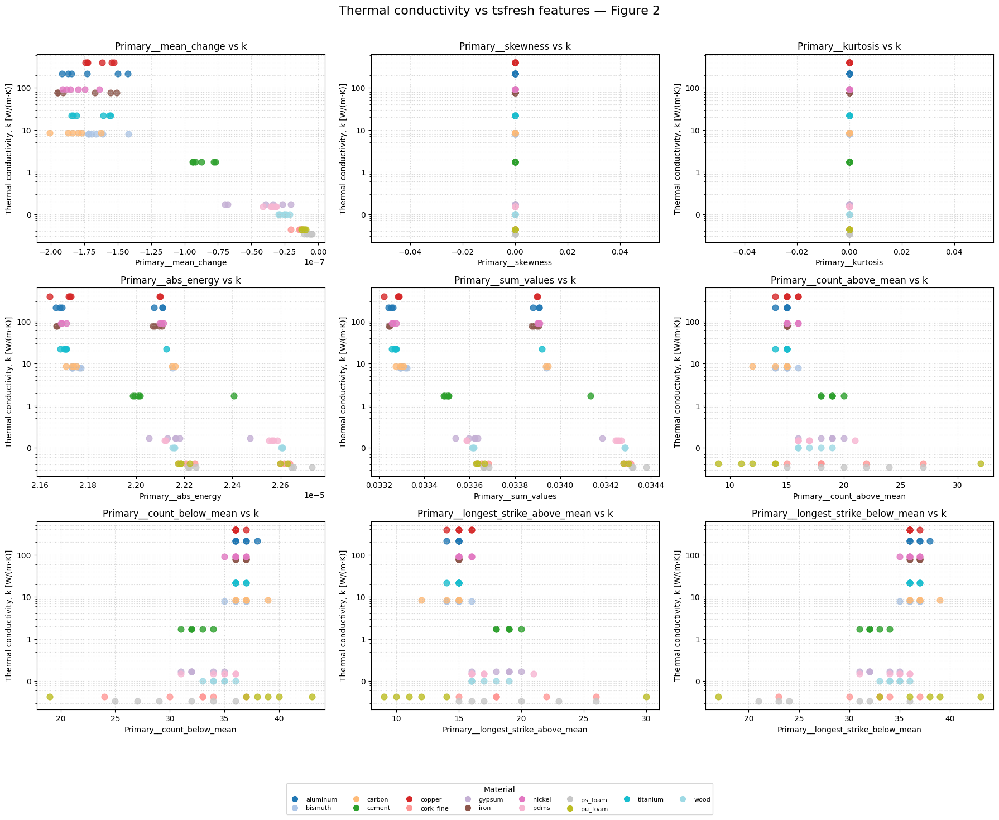

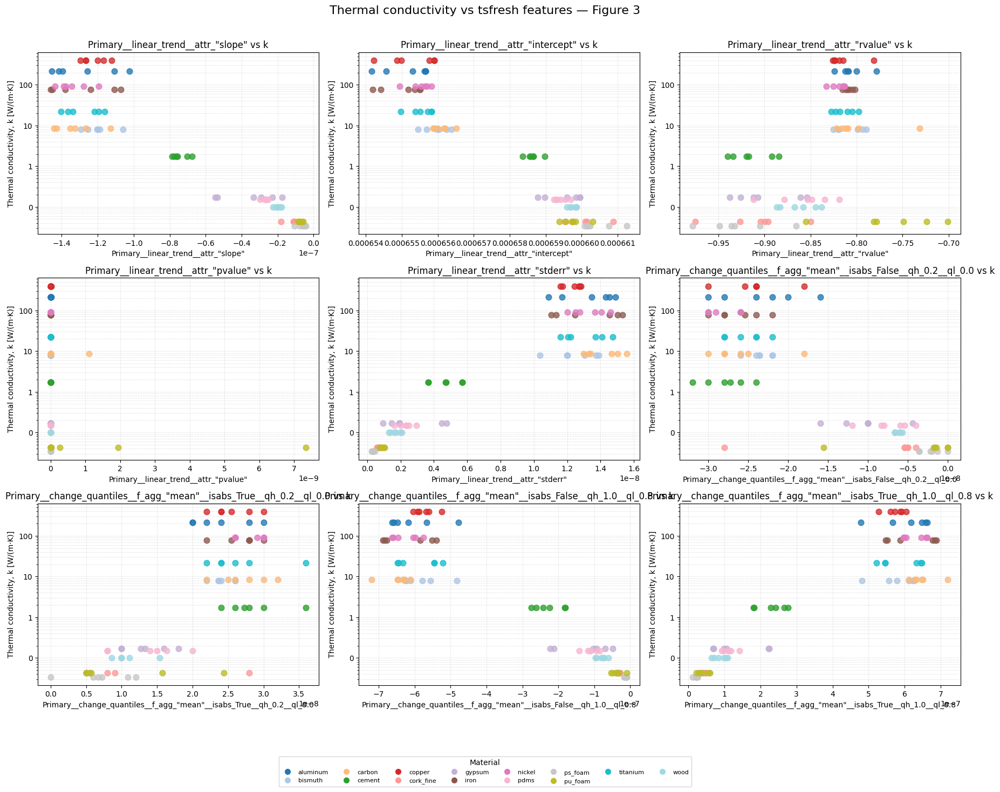

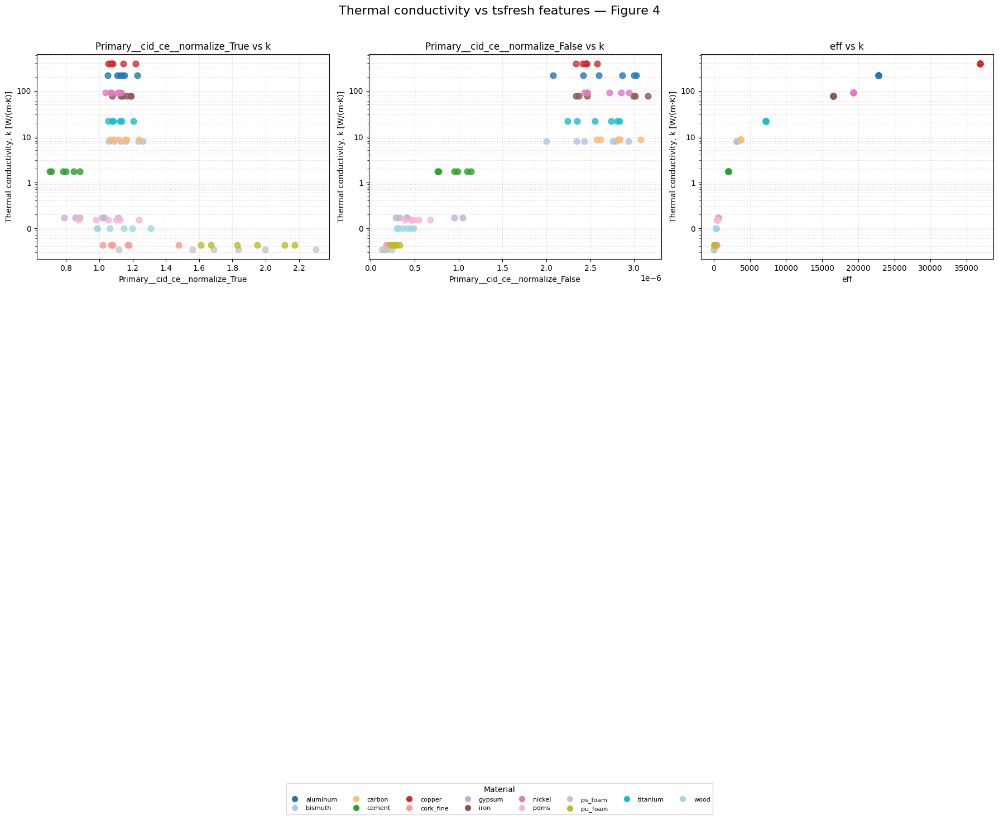

In [128]:
legend_col = "Sample"
y_col = "k"

plots_per_fig = 9
n_cols = 3
n_rows = 3


# --------------------------------------------------
# Prepare data
# --------------------------------------------------

plot_df = FEATURES_TSFRESH.copy()

# Replace infinite values with NaN
plot_df = plot_df.replace(
    [np.inf, -np.inf],
    np.nan
)

# Ensure k is numeric
plot_df[y_col] = pd.to_numeric(
    plot_df[y_col],
    errors="coerce"
)

# Log scale requires positive k values
plot_df = plot_df[
    plot_df[y_col] > 0
].copy()


# --------------------------------------------------
# Select numeric tsfresh features
# --------------------------------------------------

excluded_cols = [
    "Sample",
    "Trial",
    "index",
    "k",
    "elbow_time"
]

candidate_features = [
    col
    for col in plot_df.select_dtypes(
        include=np.number
    ).columns
    if col not in excluded_cols
]


# Drop feature columns containing any NaN
features = [
    col
    for col in candidate_features
    if plot_df[col].notna().all()
]

dropped_features = [
    col
    for col in candidate_features
    if col not in features
]

print(
    f"Features retained: {len(features)}"
)

print(
    f"Features removed because of NaN: "
    f"{len(dropped_features)}"
)


# --------------------------------------------------
# Create one consistent color per material
# --------------------------------------------------

groups = (
    plot_df[legend_col]
    .dropna()
    .unique()
)

cmap = plt.get_cmap(
    "tab20",
    len(groups)
)

material_colors = {
    group: cmap(i)
    for i, group in enumerate(groups)
}


# --------------------------------------------------
# Plot k against each tsfresh feature
# --------------------------------------------------

n_figures = math.ceil(
    len(features) / plots_per_fig
)

for fig_num in range(n_figures):

    start = fig_num * plots_per_fig
    end = start + plots_per_fig

    current_features = features[start:end]

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 15)
    )

    axes = axes.flatten()

    for ax, feature in zip(
        axes,
        current_features
    ):

        for group in groups:

            subset = plot_df[
                plot_df[legend_col] == group
            ].dropna(
                subset=[feature, y_col]
            )

            if subset.empty:
                continue

            ax.scatter(
                subset[feature],
                subset[y_col],
                color=material_colors[group],
                label=str(group),
                alpha=0.8,
                s=60
            )

        ax.set_xlabel(feature)

        ax.set_ylabel(
            "Thermal conductivity, k [W/(m·K)]"
        )

        ax.set_title(
            f"{feature} vs k"
        )

        # Logarithmic numeric y-axis
        ax.set_yscale("log")

        # Show ordinary numeric labels
        ax.yaxis.set_major_formatter(
            ScalarFormatter()
        )

        ax.grid(
            which="both",
            linestyle=":",
            alpha=0.5
        )


    # Hide unused axes in the final figure
    for ax in axes[len(current_features):]:
        ax.axis("off")


    # Shared legend with multiple materials per row
    legend_handles = [
        Line2D(
            [0],
            [0],
            marker="o",
            linestyle="",
            markerfacecolor=material_colors[group],
            markeredgecolor=material_colors[group],
            markersize=7,
            label=str(group)
        )
        for group in groups
    ]

    fig.legend(
        handles=legend_handles,
        title="Material",
        loc="lower center",
        bbox_to_anchor=(0.5, 0.01),
        ncol=min(8, len(groups)),
        fontsize=8
    )

    fig.suptitle(
        f"Thermal conductivity vs tsfresh features "
        f"— Figure {fig_num + 1}",
        fontsize=16
    )

    plt.tight_layout(
        rect=[0, 0.10, 1, 0.97]
    )

    plt.show()

# Feature Extraction - ESN/RC

In [129]:
from reservoirpy.nodes import Reservoir

# ------------------------------------------------------------
# Prepare ESN input
# ------------------------------------------------------------

esn_data = DATA.copy()

if "diff" not in esn_data.columns:
    esn_data["diff"] = esn_data["Secondary"] - esn_data["Primary"]

esn_data["id"] = (
    esn_data["Sample"].astype(str)
    + "_trial_"
    + esn_data["Trial"].astype(int).astype(str)
)

input_cols = [
    "Primary",
    "Secondary",
    "diff",
]

esn_data = esn_data.replace([np.inf, -np.inf], np.nan)
esn_data = esn_data.dropna(subset=["id", "Time"] + input_cols)

esn_data = esn_data.sort_values(["id", "Time"]).reset_index(drop=True)


# ------------------------------------------------------------
# Global input scaling
# ------------------------------------------------------------

scaler = StandardScaler()

esn_data[input_cols] = scaler.fit_transform(
    esn_data[input_cols]
)


# ------------------------------------------------------------
# ESN feature extraction
# ------------------------------------------------------------

def extract_FEATURES_ESN_from_sequence(
    sequence,
    units=100,
    sr=0.9,
    lr=0.3,
    input_scaling=0.5,
    random_state=42,
):
    reservoir = Reservoir(
        units=units,
        sr=sr,
        lr=lr,
        input_scaling=input_scaling,
        seed=random_state,
    )

    states = reservoir.run(sequence)

    features = {}

    for state_idx in range(states.shape[1]):
        state_values = states[:, state_idx]

        features[f"esn_state_{state_idx}_mean"] = np.mean(state_values)
        features[f"esn_state_{state_idx}_std"] = np.std(state_values)
        features[f"esn_state_{state_idx}_min"] = np.min(state_values)
        features[f"esn_state_{state_idx}_max"] = np.max(state_values)
        features[f"esn_state_{state_idx}_final"] = state_values[-1]

    return features

In [130]:
esn_feature_rows = []

for trial_id, subset in esn_data.groupby("id", sort=False):
    subset = subset.sort_values("Time").copy()

    sequence = subset[input_cols].to_numpy(dtype=float)

    if len(sequence) < 3:
        print(f"Skipped {trial_id}: too few observations")
        continue

    features = extract_FEATURES_ESN_from_sequence(
        sequence,
        units=10,
        sr=0.9,
        lr=0.3,
        input_scaling=0.5,
        random_state=42,
    )

    features["id"] = trial_id

    esn_feature_rows.append(features)


FEATURES_ESN = pd.DataFrame(esn_feature_rows)


# ------------------------------------------------------------
# Add labels / metadata
# ------------------------------------------------------------

labels = (
    esn_data[["id", "Sample", "Trial", "Label", "k" , "eff"]]
    .drop_duplicates()
)

FEATURES_ESN = FEATURES_ESN.merge(
    labels,
    on="id",
    how="left",
    validate="one_to_one",
)

FEATURES_ESN.head()

,esn_state_0_mean,esn_state_0_std,esn_state_0_min,esn_state_0_max,esn_state_0_final,esn_state_1_mean,esn_state_1_std,esn_state_1_min,esn_state_1_max,esn_state_1_final,...,esn_state_9_std,esn_state_9_min,esn_state_9_max,esn_state_9_final,id,Sample,Trial,Label,k,eff
0,0.554100,0.306441,0.000000,0.904214,0.904214,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,aluminum_trial_1,aluminum,1,metal,215.0,22819.038104
1,0.799709,0.217187,0.000000,0.911231,0.911231,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,aluminum_trial_2,aluminum,2,metal,215.0,22819.038104
2,0.779201,0.220196,0.000000,0.910100,0.910100,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,aluminum_trial_3,aluminum,3,metal,215.0,22819.038104
3,-0.082517,0.628088,-0.800876,0.866321,0.866321,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,aluminum_trial_4,aluminum,4,metal,215.0,22819.038104
4,-0.100008,0.619258,-0.798449,0.859182,0.859182,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,aluminum_trial_5,aluminum,5,metal,215.0,22819.038104


# Machine Learning

## 6-Fold Classification

In [131]:
def simple_multiclass_logistic_cv(
    df,
    target_col="Label",
    stratify_col="Label",
    random_state=42,
    n_splits=6,
    class_order=[
        "foam",
        "composite",
        "polymer",
        "ceramic",
        "metal",
    ],
):
    work_df = (
        df
        .copy()
        .replace([np.inf, -np.inf], np.nan)
        .dropna(subset=[target_col, stratify_col])
        .reset_index(drop=False)
        .rename(columns={"index": "original_index"})
    )

    excluded_cols = [
        "Sample",
        "Trial",
        "Label",
        "k",
        "index",
        "original_index",
        "elbow_time",
        "elbow_idx",
        "elbow_value",
        "is_elbow",
        "Elbow time",
        "Elbow value",
        "Elbow index",
        "eff",
    ]

    features = [
        col
        for col in work_df.select_dtypes(include=np.number).columns
        if col not in excluded_cols
    ]

    features = [
        col
        for col in features
        if work_df[col].notna().any()
    ]

    X = work_df[features]
    y = work_df[target_col]
    stratify_y = work_df[stratify_col]

    ordered_classes = [
        label
        for label in class_order
        if label in y.unique()
    ]

    print("Number of features:", len(features))
    print("Target column:", target_col)
    print("Stratify column:", stratify_col)
    print("Classes:", ordered_classes)

    print("\nClass counts:")
    print(y.value_counts())

    cv = StratifiedKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state,
    )

    cv_rows = []
    oof_rows = []

    for fold, (train_idx, test_idx) in enumerate(
        cv.split(X, stratify_y),
        start=1,
    ):
        X_train = X.iloc[train_idx]
        X_test = X.iloc[test_idx]

        y_train = y.iloc[train_idx]
        y_test = y.iloc[test_idx]

        model = Pipeline([
            ("imputer", SimpleImputer(strategy="median")),
            ("scaler", StandardScaler()),
            (
                "classifier",
                LogisticRegression(
                    solver="lbfgs",
                    max_iter=5000,
                    C=1.0,
                    class_weight=None,
                    random_state=random_state,
                ),
            ),
        ])

        model.fit(X_train, y_train)

        y_pred = model.predict(X_test)

        report = classification_report(
            y_test,
            y_pred,
            labels=ordered_classes,
            zero_division=0,
            output_dict=True,
        )

        cv_rows.append({
            "fold": fold,
            "n_test": len(test_idx),
            "accuracy": report["accuracy"],
            "macro_precision": report["macro avg"]["precision"],
            "macro_recall": report["macro avg"]["recall"],
            "macro_f1": report["macro avg"]["f1-score"],
            "weighted_precision": report["weighted avg"]["precision"],
            "weighted_recall": report["weighted avg"]["recall"],
            "weighted_f1": report["weighted avg"]["f1-score"],
        })

        fold_oof = work_df.iloc[test_idx][
            [
                "original_index",
                "Sample",
                "Trial",
                target_col,
            ]
        ].copy()

        fold_oof["fold"] = fold
        fold_oof["y_true"] = y_test.values
        fold_oof["y_pred"] = y_pred

        oof_rows.append(fold_oof)

        print(f"\nFold {fold}")
        print("Test rows:", len(test_idx))
        print("Accuracy:", report["accuracy"])

    cv_results = pd.DataFrame(cv_rows)
    oof_predictions = pd.concat(oof_rows, axis=0).sort_values("original_index")

    # ------------------------------------------------------------
    # Verify each original row appears exactly once out-of-fold
    # ------------------------------------------------------------

    duplicate_count = oof_predictions["original_index"].duplicated().sum()
    missing_count = len(work_df) - oof_predictions["original_index"].nunique()

    print("\nOOF prediction check:")
    print("Rows in modeling data:", len(work_df))
    print("Rows with OOF predictions:", len(oof_predictions))
    print("Unique original rows predicted:", oof_predictions["original_index"].nunique())
    print("Duplicate OOF predictions:", duplicate_count)
    print("Missing OOF predictions:", missing_count)

    if duplicate_count != 0 or missing_count != 0:
        raise ValueError(
            "OOF prediction issue: some rows were predicted more than once or not predicted."
        )

    # ------------------------------------------------------------
    # Final performance from all out-of-fold predictions
    # ------------------------------------------------------------

    y_true_oof = oof_predictions["y_true"]
    y_pred_oof = oof_predictions["y_pred"]

    overall_report_dict = classification_report(
        y_true_oof,
        y_pred_oof,
        labels=ordered_classes,
        zero_division=0,
        output_dict=True,
    )

    overall_results = {
        "accuracy": overall_report_dict["accuracy"],
        "macro_precision": overall_report_dict["macro avg"]["precision"],
        "macro_recall": overall_report_dict["macro avg"]["recall"],
        "macro_f1": overall_report_dict["macro avg"]["f1-score"],
        "weighted_precision": overall_report_dict["weighted avg"]["precision"],
        "weighted_recall": overall_report_dict["weighted avg"]["recall"],
        "weighted_f1": overall_report_dict["weighted avg"]["f1-score"],
    }

    overall_results = pd.DataFrame([overall_results])

    print("\nPer-fold CV performance:")
    print(cv_results.round(4))

    print("\nFinal out-of-fold performance:")
    print(overall_results.round(4))

    print("\nOverall out-of-fold classification report:")
    print(
        classification_report(
            y_true_oof,
            y_pred_oof,
            labels=ordered_classes,
            zero_division=0,
        )
    )

    ConfusionMatrixDisplay.from_predictions(
        y_true_oof,
        y_pred_oof,
        labels=ordered_classes,
        display_labels=[
            str(label).replace("_", " ").title()
            for label in ordered_classes
        ],
        cmap="Blues",
        xticks_rotation=45,
    )

    plt.xlabel("Predicted material cluster")
    plt.ylabel("Actual material cluster")
    plt.title("Out-of-Fold Multiclass Logistic Regression")
    plt.tight_layout()
    plt.show()

    # ------------------------------------------------------------
    # Train final model on all data after evaluation
    # ------------------------------------------------------------

    final_model = Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        (
            "classifier",
            LogisticRegression(
                solver="lbfgs",
                max_iter=5000,
                C=1.0,
                class_weight=None,
                random_state=random_state,
            ),
        ),
    ])

    final_model.fit(X, y)

    return final_model, features, cv_results, overall_results, oof_predictions

### Feature: thermal parameters

Number of features: 56
Target column: Label
Stratify column: Label
Classes: ['foam', 'composite', 'polymer', 'ceramic', 'metal']

Class counts:
Label
metal        36
ceramic      18
composite    12
foam         12
polymer       6
Name: count, dtype: int64

Fold 1
Test rows: 14
Accuracy: 0.7857142857142857

Fold 2
Test rows: 14
Accuracy: 0.7857142857142857

Fold 3
Test rows: 14
Accuracy: 0.5

Fold 4
Test rows: 14
Accuracy: 0.7857142857142857

Fold 5
Test rows: 14
Accuracy: 0.6428571428571429

Fold 6
Test rows: 14
Accuracy: 0.9285714285714286

OOF prediction check:
Rows in modeling data: 84
Rows with OOF predictions: 84
Unique original rows predicted: 84
Duplicate OOF predictions: 0
Missing OOF predictions: 0

Per-fold CV performance:
   fold  n_test  accuracy  macro_precision  macro_recall  macro_f1  \
0     1      14    0.7857           0.6714        0.6667    0.6179   
1     2      14    0.7857           0.8600        0.8667    0.8597   
2     3      14    0.5000           0.4267     

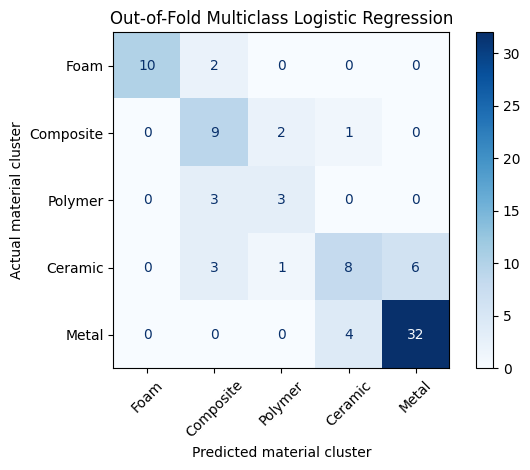

Number of logistic features used: 56
['primary_max_change', 'primary_response_auc', 'primary_early_window_rate', 'primary_mid_window_rate', 'primary_late_window_rate', 'primary_max_abs_rate', 'primary_rate_auc', 'primary_rate_std', 'secondary_max_change', 'secondary_response_auc', 'secondary_early_window_rate', 'secondary_mid_window_rate', 'secondary_late_window_rate', 'secondary_max_abs_rate', 'secondary_rate_auc', 'secondary_rate_std', 'difference_max_change', 'difference_response_auc', 'difference_early_window_rate', 'difference_mid_window_rate', 'difference_late_window_rate', 'difference_max_abs_rate', 'difference_rate_auc', 'difference_rate_std', 'secondary_early_rate_ratio', 'secondary_mid_rate_ratio', 'secondary_late_rate_ratio', 'secondary_rate_auc_ratio', 'mean_top_bottom_rate_difference', 'max_top_bottom_rate_difference', 'max_abs_top_bottom_rate_difference', 'top_bottom_rate_difference_auc', 'top_bottom_rate_difference_std', 'q_pdms_mean', 'q_pdms_max', 'q_pdms_min', 'q_pdms

In [132]:
# ------------------------------------------------------------
# Select corrected feature set for multiclass logistic CV
# ------------------------------------------------------------

logistic_feature_cols = [
    # --------------------------------------------------------
    # Primary sensor
    # --------------------------------------------------------
    "primary_max_change",
    "primary_response_auc",
    "primary_early_window_rate",
    "primary_mid_window_rate",
    "primary_late_window_rate",
    "primary_max_abs_rate",
    "primary_rate_auc",
    "primary_rate_std",

    # --------------------------------------------------------
    # Secondary sensor
    # --------------------------------------------------------
    "secondary_max_change",
    "secondary_response_auc",
    "secondary_early_window_rate",
    "secondary_mid_window_rate",
    "secondary_late_window_rate",
    "secondary_max_abs_rate",
    "secondary_rate_auc",
    "secondary_rate_std",

    # --------------------------------------------------------
    # Primary - Secondary difference
    # --------------------------------------------------------
    "difference_max_change",
    "difference_response_auc",
    "difference_early_window_rate",
    "difference_mid_window_rate",
    "difference_late_window_rate",
    "difference_max_abs_rate",
    "difference_rate_auc",
    "difference_rate_std",

    # --------------------------------------------------------
    # Secondary-to-primary ratios
    # --------------------------------------------------------
    "secondary_early_rate_ratio",
    "secondary_mid_rate_ratio",
    "secondary_late_rate_ratio",
    "secondary_rate_auc_ratio",

    # --------------------------------------------------------
    # Cross-sensor derivative features
    # --------------------------------------------------------
    "mean_top_bottom_rate_difference",
    "max_top_bottom_rate_difference",
    "max_abs_top_bottom_rate_difference",
    "top_bottom_rate_difference_auc",
    "top_bottom_rate_difference_std",

    # --------------------------------------------------------
    # PDMS heat-flux features
    # --------------------------------------------------------
    "q_pdms_mean",
    "q_pdms_max",
    "q_pdms_min",
    "q_pdms_max_abs",
    "q_pdms_final",
    "q_pdms_auc",
    "q_pdms_early_window_rate",
    "q_pdms_mid_window_rate",
    "q_pdms_late_window_rate",
    "q_pdms_rate_auc",
    "q_pdms_rate_std",

    "primary_energy_density_max_change",
    "primary_energy_density_response_auc",

    "primary_power_density_early_window_rate",
    "primary_power_density_mid_window_rate",
    "primary_power_density_late_window_rate",
    "primary_power_density_max_abs_rate",
    "primary_power_density_rate_auc",

    "primary_q_app_early_window_rate",
    "primary_q_app_mid_window_rate",
    "primary_q_app_late_window_rate",
    "primary_q_app_max_abs_rate",
    "primary_q_app_rate_auc",
]


# ------------------------------------------------------------
# Keep only columns that exist in features_df
# ------------------------------------------------------------

logistic_feature_cols = [
    col
    for col in logistic_feature_cols
    if col in FEATURES_THERMAL.columns
]

model_df = FEATURES_THERMAL[
    logistic_feature_cols + ["Label", "Sample", "Trial"]
].copy()


# ------------------------------------------------------------
# Run multiclass logistic CV
# ------------------------------------------------------------

logistic_model, logistic_features, logistic_cv, logistic_overall, logistic_pred  = simple_multiclass_logistic_cv(
    df=model_df,
    target_col="Label",
    n_splits=6,
    random_state=42,
)

print(f"Number of logistic features used: {len(logistic_feature_cols)}")
print(logistic_feature_cols)

In [133]:
logistic_overall

,accuracy,macro_precision,macro_recall,macro_f1,weighted_precision,weighted_recall,weighted_f1
0,0.738095,0.69738,0.683333,0.682155,0.746972,0.738095,0.73551


### Features: time-series

Number of features: 29
Target column: Label
Stratify column: Label
Classes: ['foam', 'composite', 'polymer', 'ceramic', 'metal']

Class counts:
Label
metal        36
ceramic      18
composite    12
foam         12
polymer       6
Name: count, dtype: int64

Fold 1
Test rows: 14
Accuracy: 0.7857142857142857

Fold 2
Test rows: 14
Accuracy: 0.8571428571428571



Fold 3
Test rows: 14
Accuracy: 0.6428571428571429

Fold 4
Test rows: 14
Accuracy: 0.8571428571428571

Fold 5
Test rows: 14
Accuracy: 0.9285714285714286

Fold 6
Test rows: 14
Accuracy: 0.7857142857142857

OOF prediction check:
Rows in modeling data: 84
Rows with OOF predictions: 84
Unique original rows predicted: 84
Duplicate OOF predictions: 0
Missing OOF predictions: 0

Per-fold CV performance:
   fold  n_test  accuracy  macro_precision  macro_recall  macro_f1  \
0     1      14    0.7857           0.6714        0.6667    0.6179   
1     2      14    0.8571           0.7048        0.7333    0.7179   
2     3      14    0.6429           0.5214        0.4667    0.4513   
3     4      14    0.8571           0.9200        0.8667    0.8652   
4     5      14    0.9286           0.9000        0.9333    0.8933   
5     6      14    0.7857           0.7048        0.6333    0.6379   

   weighted_precision  weighted_recall  weighted_f1  
0              0.7959           0.7857       0.7408  
1

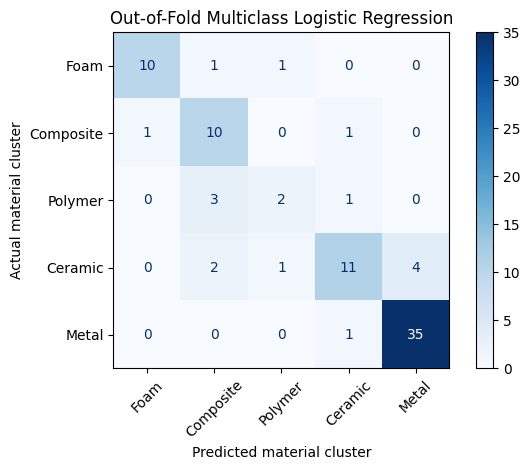

In [134]:
logistic_model, logistic_features, logistic_cv, logistic_overall, logistic_pred  = simple_multiclass_logistic_cv(
    df=FEATURES_TSFRESH[['Primary__mean', 'Primary__median', 'Primary__minimum',
       'Primary__maximum', 'Primary__absolute_maximum',
       'Primary__standard_deviation', 'Primary__variance',
       'Primary__root_mean_square', 'Primary__mean_abs_change',
       'Primary__mean_change', 'Primary__skewness', 'Primary__kurtosis',
       'Primary__abs_energy', 'Primary__sum_values',
       'Primary__count_above_mean', 'Primary__count_below_mean',
       'Primary__longest_strike_above_mean',
       'Primary__longest_strike_below_mean',
       'Primary__linear_trend__attr_"slope"',
       'Primary__linear_trend__attr_"intercept"',
       'Primary__linear_trend__attr_"rvalue"',
       'Primary__linear_trend__attr_"pvalue"',
       'Primary__linear_trend__attr_"stderr"',
       'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_0.2__ql_0.0',
       'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_0.2__ql_0.0',
       'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.8',
       'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_1.0__ql_0.8',
       'Primary__cid_ce__normalize_True', 'Primary__cid_ce__normalize_False', 'Label', 'Sample', 'Trial']],
    target_col="Label",
    n_splits=6,
    random_state=42,
)

In [135]:
logistic_overall

,accuracy,macro_precision,macro_recall,macro_f1,weighted_precision,weighted_recall,weighted_f1
0,0.809524,0.743448,0.716667,0.720937,0.807853,0.809524,0.802157


### Features: ESN

Number of features: 50
Target column: Label
Stratify column: Label
Classes: ['foam', 'composite', 'polymer', 'ceramic', 'metal']

Class counts:
Label
metal        36
ceramic      18
composite    12
foam         12
polymer       6
Name: count, dtype: int64

Fold 1
Test rows: 14
Accuracy: 0.7857142857142857



Fold 2
Test rows: 14
Accuracy: 0.7142857142857143

Fold 3
Test rows: 14
Accuracy: 0.6428571428571429

Fold 4
Test rows: 14
Accuracy: 0.7857142857142857

Fold 5
Test rows: 14
Accuracy: 0.7142857142857143

Fold 6
Test rows: 14
Accuracy: 0.9285714285714286

OOF prediction check:
Rows in modeling data: 84
Rows with OOF predictions: 84
Unique original rows predicted: 84
Duplicate OOF predictions: 0
Missing OOF predictions: 0

Per-fold CV performance:
   fold  n_test  accuracy  macro_precision  macro_recall  macro_f1  \
0     1      14    0.7857           0.6714        0.6667    0.6179   
1     2      14    0.7143           0.5048        0.5667    0.5246   
2     3      14    0.6429           0.3548        0.5000    0.4113   
3     4      14    0.7857           0.6381        0.6333    0.6113   
4     5      14    0.7143           0.4167        0.5000    0.4514   
5     6      14    0.9286           0.7500        0.8000    0.7714   

   weighted_precision  weighted_recall  weighted_f1  
0   

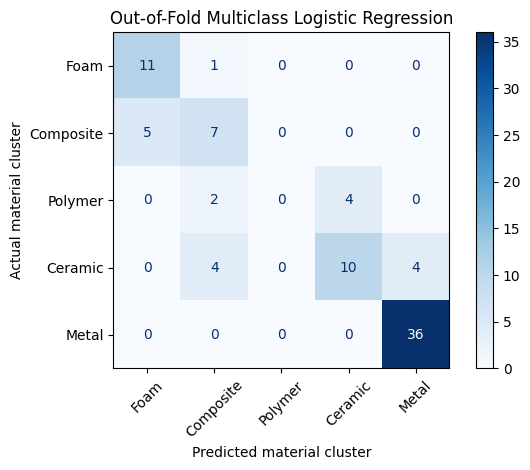

In [136]:
logistic_model, logistic_features, logistic_cv, logistic_overall, logistic_pred  = simple_multiclass_logistic_cv(
    df=FEATURES_ESN[[c for c in FEATURES_ESN.columns if 'esn' in c] + ['Label', 'Sample', 'Trial']],
    target_col="Label",
    n_splits=6,
    random_state=42,
)

In [137]:
logistic_overall

,accuracy,macro_precision,macro_recall,macro_f1,weighted_precision,weighted_recall,weighted_f1
0,0.761905,0.560357,0.611111,0.579309,0.708418,0.761905,0.729112


## 6-Fold Regression

In [138]:
def safe_mape(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    valid = np.isfinite(y_true) & np.isfinite(y_pred) & ~np.isclose(y_true, 0)

    if valid.sum() == 0:
        return np.nan

    return np.mean(np.abs((y_true[valid] - y_pred[valid]) / y_true[valid])) * 100


def safe_medape(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    valid = np.isfinite(y_true) & np.isfinite(y_pred) & ~np.isclose(y_true, 0)

    if valid.sum() == 0:
        return np.nan

    return np.median(np.abs((y_true[valid] - y_pred[valid]) / y_true[valid])) * 100


def safe_smape(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    denominator = np.abs(y_true) + np.abs(y_pred)

    valid = (
        np.isfinite(y_true)
        & np.isfinite(y_pred)
        & ~np.isclose(denominator, 0)
    )

    if valid.sum() == 0:
        return np.nan

    return np.mean(
        2 * np.abs(y_pred[valid] - y_true[valid]) / denominator[valid]
    ) * 100


def safe_nrmse(y_true, y_pred, method="range"):
    """
    Normalized RMSE.

    method="range":
        NRMSE = RMSE / (max(y_true) - min(y_true))

    method="mean":
        NRMSE = RMSE / mean(y_true)

    method="std":
        NRMSE = RMSE / std(y_true)
    """
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    valid = (
        np.isfinite(y_true)
        & np.isfinite(y_pred)
    )

    if valid.sum() == 0:
        return np.nan

    y_true_valid = y_true[valid]
    y_pred_valid = y_pred[valid]

    rmse = np.sqrt(
        mean_squared_error(
            y_true_valid,
            y_pred_valid,
        )
    )

    if method == "range":
        denominator = np.max(y_true_valid) - np.min(y_true_valid)

    elif method == "mean":
        denominator = np.mean(y_true_valid)

    elif method == "std":
        denominator = np.std(y_true_valid, ddof=1)

    else:
        raise ValueError(
            "method must be one of: 'range', 'mean', or 'std'"
        )

    if not np.isfinite(denominator) or np.isclose(denominator, 0):
        return np.nan

    return rmse / denominator

def regression_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    rmse = np.sqrt(
        mean_squared_error(
            y_true,
            y_pred,
        )
    )

    return {
        "mae": mean_absolute_error(y_true, y_pred),
        "rmse": rmse,
        "nrmse_range": safe_nrmse(y_true, y_pred, method="range"),
        "nrmse_mean": safe_nrmse(y_true, y_pred, method="mean"),
        "nrmse_std": safe_nrmse(y_true, y_pred, method="std"),
        "r2": r2_score(y_true, y_pred) if len(y_true) >= 2 else np.nan,
        "mape": safe_mape(y_true, y_pred),
        "medape": safe_medape(y_true, y_pred),
        "smape": safe_smape(y_true, y_pred),
        "max_error": max_error(y_true, y_pred),
    }

def simple_log_linear_regression_cv(
    df,
    target_col="k",
    eval_group_col="Label",
    stratify_col="Label",
    random_state=42,
    n_splits=6
):
    work_df = (
        df
        .copy()
        .replace([np.inf, -np.inf], np.nan)
        .dropna(subset=[target_col])
        .reset_index(drop=False)
        .rename(columns={"index": "original_index"})
    )

    # log1p target requires y >= 0
    work_df = work_df[work_df[target_col] >= 0].copy()

    excluded_cols = [
        "Sample",
        "Trial",
        "Label",
        "k",
        "eff",
        "index",
        "original_index",
        "elbow_time",
        "elbow_idx",
        "elbow_value",
        "is_elbow",
        "Elbow time",
        "Elbow value",
        "Elbow index",
    ]

    excluded_cols = list(set(excluded_cols + [target_col]))

    features = [
        col
        for col in work_df.select_dtypes(include=np.number).columns
        if col not in excluded_cols
    ]

    features = [
        col
        for col in features
        if work_df[col].notna().any()
    ]

    X = work_df[features]
    y = work_df[target_col]

    print("Number of features:", len(features))
    print("Target:", target_col)
    print("Evaluation group:", eval_group_col)
    print("Stratify column:", stratify_col)
    print(f"Model target transform: log1p({target_col})")
    print(f"Prediction inverse transform: expm1(predicted log1p({target_col}))")

    # ------------------------------------------------------------
    # Choose CV splitter
    # ------------------------------------------------------------

    if stratify_col is not None and stratify_col in work_df.columns:
        stratify_y = work_df[stratify_col]

        min_class_count = stratify_y.value_counts().min()

        if min_class_count < n_splits:
            raise ValueError(
                f"Cannot use n_splits={n_splits}. "
                f"The smallest class in {stratify_col} has only {min_class_count} samples."
            )

        cv = StratifiedKFold(
            n_splits=n_splits,
            shuffle=True,
            random_state=random_state,
        )

        split_iterator = cv.split(X, stratify_y)

    else:
        cv = KFold(
            n_splits=n_splits,
            shuffle=True,
            random_state=random_state,
        )

        split_iterator = cv.split(X, y)

    cv_rows = []
    group_rows = []
    oof_rows = []

    # ------------------------------------------------------------
    # 6-fold CV
    # ------------------------------------------------------------

    for fold, (train_idx, test_idx) in enumerate(split_iterator, start=1):
        X_train = X.iloc[train_idx]
        X_test = X.iloc[test_idx]

        y_train = y.iloc[train_idx]
        y_test = y.iloc[test_idx]

        base_model = Pipeline([
            ("imputer", SimpleImputer(strategy="median")),
            ("scaler", StandardScaler()),
            ("regressor", Ridge(alpha=0.1)),
        ])

        model = TransformedTargetRegressor(
            regressor=base_model,
            func=np.log1p,
            inverse_func=np.expm1,
            check_inverse=False,
        )

        model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_pred = np.clip(y_pred, 0, None)

        fold_metrics = regression_metrics(y_test, y_pred)

        cv_rows.append({
            "fold": fold,
            "n_test": len(test_idx),
            **fold_metrics,
        })

        fold_oof = work_df.iloc[test_idx][
            [
                "original_index",
                eval_group_col,
            ]
        ].copy()

        if "Sample" in work_df.columns:
            fold_oof["Sample"] = work_df.iloc[test_idx]["Sample"].values

        if "Trial" in work_df.columns:
            fold_oof["Trial"] = work_df.iloc[test_idx]["Trial"].values

        fold_oof["fold"] = fold
        fold_oof["y_true"] = y_test.values
        fold_oof["y_pred"] = y_pred

        oof_rows.append(fold_oof)

        print(f"MAE: {fold_metrics['mae']:.4f}")
        print(f"RMSE: {fold_metrics['rmse']:.4f}")
        print(f"NRMSE range: {fold_metrics['nrmse_range']:.4f}")
        print(f"NRMSE mean: {fold_metrics['nrmse_mean']:.4f}")
        print(f"NRMSE std: {fold_metrics['nrmse_std']:.4f}")
        print(f"R2: {fold_metrics['r2']:.4f}")
        print(f"MAPE: {fold_metrics['mape']:.4f}%")
        print(f"MedAPE: {fold_metrics['medape']:.4f}%")
        print(f"SMAPE: {fold_metrics['smape']:.4f}%")
        print(f"Max error: {fold_metrics['max_error']:.4f}")

        # Per-group fold metrics
        fold_eval = pd.DataFrame({
            "group": work_df.iloc[test_idx][eval_group_col].values,
            "y_true": y_test.values,
            "y_pred": y_pred,
        })

        for group_name, group_data in fold_eval.groupby("group"):
            group_metrics = regression_metrics(
                group_data["y_true"],
                group_data["y_pred"],
            )

            group_rows.append({
                "fold": fold,
                "group": group_name,
                "n": len(group_data),
                **group_metrics,
            })

    cv_results = pd.DataFrame(cv_rows)
    group_cv_results = pd.DataFrame(group_rows)

    oof_predictions = (
        pd.concat(oof_rows, axis=0)
        .sort_values("original_index")
        .reset_index(drop=True)
    )

    # ------------------------------------------------------------
    # Verify each row has exactly one OOF prediction
    # ------------------------------------------------------------

    duplicate_count = oof_predictions["original_index"].duplicated().sum()
    missing_count = len(work_df) - oof_predictions["original_index"].nunique()

    print("\nOOF prediction check:")
    print("Rows in modeling data:", len(work_df))
    print("Rows with OOF predictions:", len(oof_predictions))
    print("Unique original rows predicted:", oof_predictions["original_index"].nunique())
    print("Duplicate OOF predictions:", duplicate_count)
    print("Missing OOF predictions:", missing_count)

    if duplicate_count != 0 or missing_count != 0:
        raise ValueError(
            "OOF prediction issue: some rows were predicted more than once or not predicted."
        )

    # ------------------------------------------------------------
    # Final performance from all OOF predictions
    # ------------------------------------------------------------

    overall_metrics = regression_metrics(
        oof_predictions["y_true"],
        oof_predictions["y_pred"],
    )

    overall_results = pd.DataFrame([overall_metrics])

    print("\nPer-fold CV performance:")
    print(cv_results.round(4))

    print("\nFinal out-of-fold performance:")
    print(overall_results.round(4))

    print("\nAverage performance per group from OOF predictions:")
    group_oof_results = []

    for group_name, group_data in oof_predictions.groupby(eval_group_col):
        group_metrics = regression_metrics(
            group_data["y_true"],
            group_data["y_pred"],
        )

        group_oof_results.append({
            "group": group_name,
            "n": len(group_data),
            **group_metrics,
        })

    group_oof_results = pd.DataFrame(group_oof_results)
    print(group_oof_results.round(4))

    # ------------------------------------------------------------
    # Actual vs predicted plot using OOF predictions
    # ------------------------------------------------------------
    plt.figure(figsize=(7, 6))

    label_col = eval_group_col  # usually "Label"

    groups = (
        oof_predictions[label_col]
        .dropna()
        .unique()
    )

    groups = sorted(groups)

    cmap = plt.get_cmap("tab10", len(groups))

    group_colors = {
        group: cmap(i)
        for i, group in enumerate(groups)
    }

    for group in groups:
        subset = oof_predictions[
            oof_predictions[label_col] == group
        ]

        plt.scatter(
            subset["y_true"],
            subset["y_pred"],
            label=str(group).replace("_", " ").title(),
            color=group_colors[group],
            alpha=0.8,
            s=60,
            edgecolor="none",
        )

    min_value = 0
    max_value = max(
        oof_predictions["y_true"].max(),
        oof_predictions["y_pred"].max(),
    )

    plt.plot(
        [min_value, max_value],
        [min_value, max_value],
        linestyle=":",
        color="black",
        linewidth=1,
        label="Ideal prediction",
    )

    plt.xscale("log")
    plt.yscale("log")

    plt.xlabel(f"Actual {target_col}")
    plt.ylabel(f"Predicted {target_col}")
    plt.title(f"6-Fold OOF Log-Linear Regression: Actual vs Predicted {target_col}")

    plt.legend(
        title="Material cluster",
        fontsize=8,
        title_fontsize=9,
        loc="best",
    )

    plt.tight_layout()
    plt.show()

    # ------------------------------------------------------------
    # Final model trained on all data after evaluation
    # ------------------------------------------------------------

    final_base_model = Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("regressor", Ridge(alpha=0.1)),
    ])

    final_model = TransformedTargetRegressor(
        regressor=final_base_model,
        func=np.log1p,
        inverse_func=np.expm1,
        check_inverse=False,
    )

    final_model.fit(X, y)

    return (
        final_model,
        features,
        cv_results,
        overall_results,
        group_oof_results,
        oof_predictions,
    )

### Features: thermal parameters

#### Target: k

Number of features: 56
Target: k
Evaluation group: Label
Stratify column: Label
Model target transform: log1p(k)
Prediction inverse transform: expm1(predicted log1p(k))
MAE: 53.7275
RMSE: 109.3844
NRMSE range: 0.2769
NRMSE mean: 1.0722
NRMSE std: 0.6759
R2: 0.5080
MAPE: 406.9796%
MedAPE: 100.0000%
SMAPE: 106.4979%
Max error: 289.0770


MAE: 13.0097
RMSE: 35.4683
NRMSE range: 0.3903
NRMSE mean: 2.0793
NRMSE std: 1.2001
R2: -0.5510
MAPE: 81.0062%
MedAPE: 80.9287%
SMAPE: 96.6269%
Max error: 128.3520
MAE: 45.3188
RMSE: 99.5558
NRMSE range: 0.2521
NRMSE mean: 1.5985
NRMSE std: 0.8132
R2: 0.2879
MAPE: 73.8935%
MedAPE: 70.7365%
SMAPE: 108.6013%
Max error: 290.2235
MAE: 35.9054
RMSE: 75.2847
NRMSE range: 0.1906
NRMSE mean: 1.4882
NRMSE std: 0.7114
R2: 0.4550
MAPE: 202.9239%
MedAPE: 92.3289%
SMAPE: 91.2119%
Max error: 253.9963
MAE: 14.3497
RMSE: 28.3547
NRMSE range: 0.0718
NRMSE mean: 0.4765
NRMSE std: 0.2494
R2: 0.9330
MAPE: 308.0485%
MedAPE: 100.0000%
SMAPE: 101.7617%
Max error: 96.9783
MAE: 45.5345
RMSE: 73.5333
NRMSE range: 0.3421
NRMSE mean: 1.2349
NRMSE std: 0.8243
R2: 0.2682
MAPE: 345.3896%
MedAPE: 84.0216%
SMAPE: 100.0710%
Max error: 162.9671

OOF prediction check:
Rows in modeling data: 84
Rows with OOF predictions: 84
Unique original rows predicted: 84
Duplicate OOF predictions: 0
Missing OOF predictions: 0

Per-fol

/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:211: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users

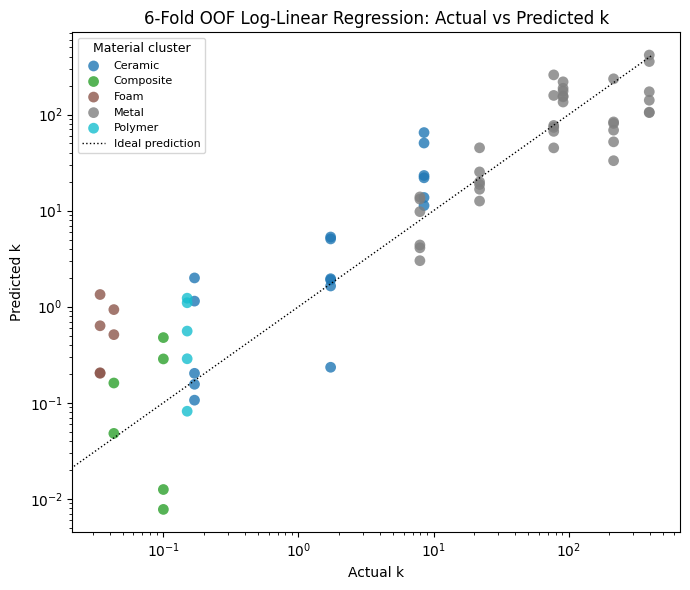

Number of regression features used: 56
['primary_max_change', 'primary_response_auc', 'primary_early_window_rate', 'primary_mid_window_rate', 'primary_late_window_rate', 'primary_max_abs_rate', 'primary_rate_auc', 'primary_rate_std', 'secondary_max_change', 'secondary_response_auc', 'secondary_early_window_rate', 'secondary_mid_window_rate', 'secondary_late_window_rate', 'secondary_max_abs_rate', 'secondary_rate_auc', 'secondary_rate_std', 'difference_max_change', 'difference_response_auc', 'difference_early_window_rate', 'difference_mid_window_rate', 'difference_late_window_rate', 'difference_max_abs_rate', 'difference_rate_auc', 'difference_rate_std', 'secondary_early_rate_ratio', 'secondary_mid_rate_ratio', 'secondary_late_rate_ratio', 'secondary_rate_auc_ratio', 'mean_top_bottom_rate_difference', 'max_top_bottom_rate_difference', 'max_abs_top_bottom_rate_difference', 'top_bottom_rate_difference_auc', 'top_bottom_rate_difference_std', 'q_pdms_mean', 'q_pdms_max', 'q_pdms_min', 'q_pd

In [139]:
# ------------------------------------------------------------
# Select corrected feature set for thermal conductivity regression
# ------------------------------------------------------------

regression_feature_cols = [
    # Primary sensor
    "primary_max_change",
    "primary_response_auc",
    "primary_early_window_rate",
    "primary_mid_window_rate",
    "primary_late_window_rate",
    "primary_max_abs_rate",
    "primary_rate_auc",
    "primary_rate_std",

    # Secondary sensor
    "secondary_max_change",
    "secondary_response_auc",
    "secondary_early_window_rate",
    "secondary_mid_window_rate",
    "secondary_late_window_rate",
    "secondary_max_abs_rate",
    "secondary_rate_auc",
    "secondary_rate_std",

    # Primary - Secondary difference
    "difference_max_change",
    "difference_response_auc",
    "difference_early_window_rate",
    "difference_mid_window_rate",
    "difference_late_window_rate",
    "difference_max_abs_rate",
    "difference_rate_auc",
    "difference_rate_std",

    # Secondary-to-primary ratios
    "secondary_early_rate_ratio",
    "secondary_mid_rate_ratio",
    "secondary_late_rate_ratio",
    "secondary_rate_auc_ratio",

    # Cross-sensor derivative features
    "mean_top_bottom_rate_difference",
    "max_top_bottom_rate_difference",
    "max_abs_top_bottom_rate_difference",
    "top_bottom_rate_difference_auc",
    "top_bottom_rate_difference_std",

    # PDMS heat-flux features
    "q_pdms_mean",
    "q_pdms_max",
    "q_pdms_min",
    "q_pdms_max_abs",
    "q_pdms_final",
    "q_pdms_auc",
    "q_pdms_early_window_rate",
    "q_pdms_mid_window_rate",
    "q_pdms_late_window_rate",
    "q_pdms_rate_auc",
    "q_pdms_rate_std",

    "primary_energy_density_max_change",
    "primary_energy_density_response_auc",

    "primary_power_density_early_window_rate",
    "primary_power_density_mid_window_rate",
    "primary_power_density_late_window_rate",
    "primary_power_density_max_abs_rate",
    "primary_power_density_rate_auc",

    "primary_q_app_early_window_rate",
    "primary_q_app_mid_window_rate",
    "primary_q_app_late_window_rate",
    "primary_q_app_max_abs_rate",
    "primary_q_app_rate_auc",
]


# ------------------------------------------------------------
# Keep only columns that exist in FEATURES_THERMAL
# ------------------------------------------------------------

regression_feature_cols = [
    col
    for col in regression_feature_cols
    if col in FEATURES_THERMAL.columns
]


# ------------------------------------------------------------
# Build regression dataframe
# ------------------------------------------------------------

regression_df = FEATURES_THERMAL[
    regression_feature_cols + ["k", "Label" , "eff"]
].copy()


# ------------------------------------------------------------
# Run log-linear regression CV
# ------------------------------------------------------------


regression_model, regression_features, regression_cv, regression_overall, regression_oof, regression_pred = (
    simple_log_linear_regression_cv(
        df=regression_df,
        target_col="k",
        eval_group_col="Label",
        n_splits=6,
        random_state=42,
    )
)

print(f"Number of regression features used: {len(regression_features)}")
print(regression_features)

In [140]:
regression_overall

,mae,rmse,nrmse_range,nrmse_mean,nrmse_std,r2,mape,medape,smape,max_error
0,34.640926,76.390678,0.193411,1.30584,0.690669,0.51723,236.373554,89.435192,100.795134,290.223543


In [141]:
regression_oof

,group,n,mae,rmse,nrmse_range,nrmse_mean,nrmse_std,r2,mape,medape,smape,max_error
0,ceramic,18,8.147751,17.350543,2.082898,5.004964,4.663550,-22.028030,217.115433,93.234648,84.475833,56.457378
1,composite,12,0.103068,0.139613,2.449349,1.952628,4.690145,-22.997233,135.592776,100.000000,156.677704,0.376798
2,foam,12,0.320155,0.511534,56.837144,13.286605,108.834845,-12920.843708,863.127165,297.688336,183.892851,1.304915
3,metal,36,76.536444,116.041254,0.299786,0.861458,0.852068,0.253237,58.451656,61.488920,58.724069,290.223543
4,polymer,6,0.464600,0.615095,NaN,4.100634,NaN,0.000000,309.733646,185.743473,124.218857,1.076179


#### Target: eff

Number of features: 56
Target: eff
Evaluation group: Label
Stratify column: Label
Model target transform: log1p(eff)
Prediction inverse transform: expm1(predicted log1p(eff))
MAE: 4623.7531
RMSE: 7486.1138
NRMSE range: 0.2032
NRMSE mean: 0.6251
NRMSE std: 0.5004
R2: 0.7304
MAPE: 125.1503%
MedAPE: 42.5039%
SMAPE: 60.8661%
Max error: 17418.2732
MAE: 2262.8022
RMSE: 4826.3421
NRMSE range: 0.2504
NRMSE mean: 1.0513
NRMSE std: 0.7832
R2: 0.3395
MAPE: 42.5455%
MedAPE: 46.2131%
SMAPE: 48.1504%
Max error: 17029.1652
MAE: 3376.5791
RMSE: 6996.5421
NRMSE range: 0.1899
NRMSE mean: 0.9568
NRMSE std: 0.6049
R2: 0.6060
MAPE: 49.9594%
MedAPE: 45.8691%
SMAPE: 54.1767%
Max error: 18710.1689
MAE: 4784.4984
RMSE: 7692.2703
NRMSE range: 0.2088
NRMSE mean: 0.9557
NRMSE std: 0.6824
R2: 0.4986
MAPE: 79.1759%
MedAPE: 60.7523%
SMAPE: 51.4309%
Max error: 16567.2383
MAE: 3810.6079
RMSE: 6516.9422
NRMSE range: 0.1769
NRMSE mean: 0.7763
NRMSE std: 0.5763
R2: 0.6423
MAPE: 74.9578%
MedAPE: 42.1712%
SMAPE: 48.9625%
M

/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:211: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users

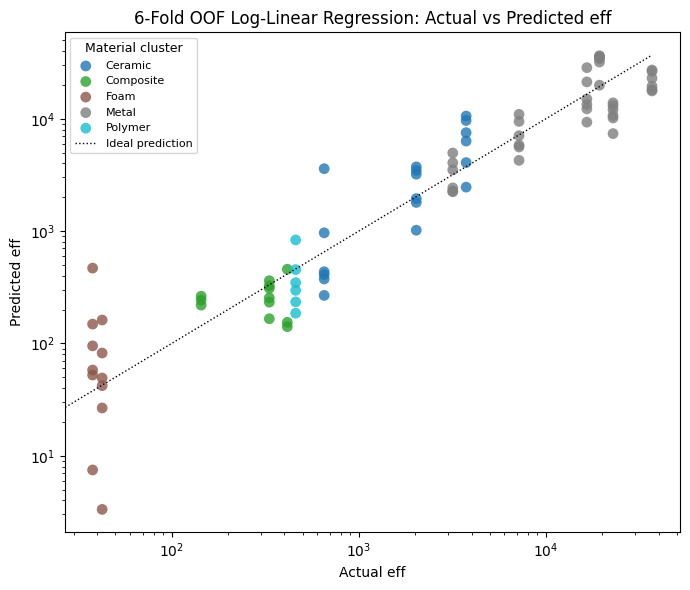

Number of regression features used: 56
['primary_max_change', 'primary_response_auc', 'primary_early_window_rate', 'primary_mid_window_rate', 'primary_late_window_rate', 'primary_max_abs_rate', 'primary_rate_auc', 'primary_rate_std', 'secondary_max_change', 'secondary_response_auc', 'secondary_early_window_rate', 'secondary_mid_window_rate', 'secondary_late_window_rate', 'secondary_max_abs_rate', 'secondary_rate_auc', 'secondary_rate_std', 'difference_max_change', 'difference_response_auc', 'difference_early_window_rate', 'difference_mid_window_rate', 'difference_late_window_rate', 'difference_max_abs_rate', 'difference_rate_auc', 'difference_rate_std', 'secondary_early_rate_ratio', 'secondary_mid_rate_ratio', 'secondary_late_rate_ratio', 'secondary_rate_auc_ratio', 'mean_top_bottom_rate_difference', 'max_top_bottom_rate_difference', 'max_abs_top_bottom_rate_difference', 'top_bottom_rate_difference_auc', 'top_bottom_rate_difference_std', 'q_pdms_mean', 'q_pdms_max', 'q_pdms_min', 'q_pd

In [142]:
# ------------------------------------------------------------
# Run log-linear regression CV
# ------------------------------------------------------------

regression_model, regression_features, regression_cv, regression_overall, regression_oof, regression_pred = (
    simple_log_linear_regression_cv(
        df=regression_df,
        target_col="eff",
        eval_group_col="Label",
        n_splits=6,
        random_state=42,
    )
)

print(f"Number of regression features used: {len(regression_features)}")
print(regression_features)

In [143]:
regression_overall

,mae,rmse,nrmse_range,nrmse_mean,nrmse_std,r2,mape,medape,smape,max_error
0,3821.880059,6776.867399,0.183983,0.836113,0.613559,0.619009,71.206926,47.105233,51.34298,19199.232652


In [144]:
regression_oof

,group,n,mae,rmse,nrmse_range,nrmse_mean,nrmse_std,r2,mape,medape,smape,max_error
0,ceramic,18,1704.817157,2585.910715,0.836555,1.207572,1.987350,-3.181887,83.358325,53.991041,55.064596,6821.877722
1,composite,12,106.090246,135.294653,0.499127,0.442419,1.302374,-0.850375,38.728212,40.057589,41.464402,273.750777
2,foam,12,73.655169,135.281422,28.733325,3.369990,55.020129,-3301.415937,189.519869,86.196757,83.018900,430.083422
3,metal,36,7973.318856,10188.050300,0.302356,0.577243,0.917459,0.134219,41.409883,39.999079,42.995710,19199.232652
4,polymer,6,192.465392,225.425776,NaN,0.490363,NaN,0.000000,41.866527,42.277116,46.667067,373.785803


### Features: time-series

#### Target: k

Number of features: 29
Target: k
Evaluation group: Label
Stratify column: Label
Model target transform: log1p(k)
Prediction inverse transform: expm1(predicted log1p(k))
MAE: 76.4527
RMSE: 148.3680
NRMSE range: 0.3756
NRMSE mean: 1.4543
NRMSE std: 0.9168
R2: 0.0948
MAPE: 974.0690%
MedAPE: 86.0818%
SMAPE: 106.7338%
Max error: 361.5367
MAE: 17.1475
RMSE: 29.0123
NRMSE range: 0.3193
NRMSE mean: 1.7008
NRMSE std: 0.9816
R2: -0.0377
MAPE: 184.4294%
MedAPE: 100.0000%
SMAPE: 126.8491%
Max error: 71.6307
MAE: 47.4245
RMSE: 104.6874
NRMSE range: 0.2651
NRMSE mean: 1.6809
NRMSE std: 0.8551
R2: 0.2125
MAPE: 110.2491%
MedAPE: 100.0000%
SMAPE: 114.2002%
Max error: 349.1804
MAE: 37.5674
RMSE: 101.4911
NRMSE range: 0.2570
NRMSE mean: 2.0063
NRMSE std: 0.9590
R2: 0.0096
MAPE: 732.1517%
MedAPE: 97.3431%
SMAPE: 128.9795%
Max error: 371.9293
MAE: 41.5036
RMSE: 92.5971
NRMSE range: 0.2344
NRMSE mean: 1.5562
NRMSE std: 0.8146
R2: 0.2854
MAPE: 916.4800%
MedAPE: 100.0000%
SMAPE: 113.6789%
Max error: 313.4494


/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:211: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users

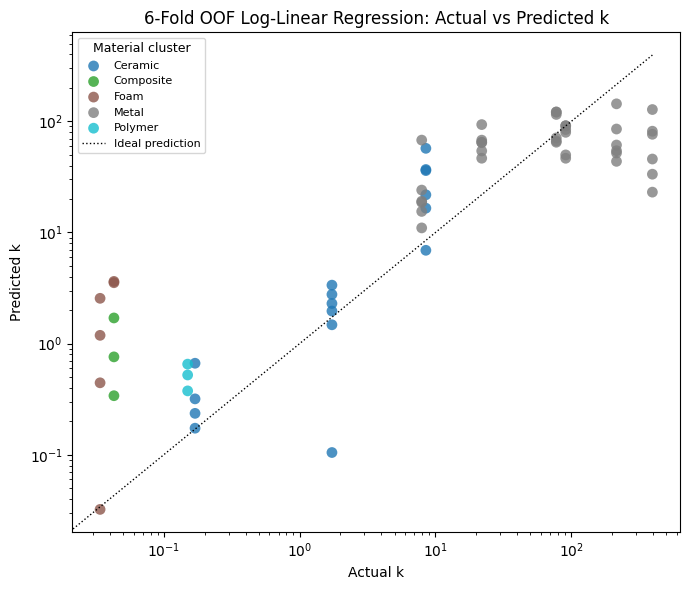

Number of regression features used: 29
['Primary__mean', 'Primary__median', 'Primary__minimum', 'Primary__maximum', 'Primary__absolute_maximum', 'Primary__standard_deviation', 'Primary__variance', 'Primary__root_mean_square', 'Primary__mean_abs_change', 'Primary__mean_change', 'Primary__skewness', 'Primary__kurtosis', 'Primary__abs_energy', 'Primary__sum_values', 'Primary__count_above_mean', 'Primary__count_below_mean', 'Primary__longest_strike_above_mean', 'Primary__longest_strike_below_mean', 'Primary__linear_trend__attr_"slope"', 'Primary__linear_trend__attr_"intercept"', 'Primary__linear_trend__attr_"rvalue"', 'Primary__linear_trend__attr_"pvalue"', 'Primary__linear_trend__attr_"stderr"', 'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_0.2__ql_0.0', 'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_0.2__ql_0.0', 'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.8', 'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_1.0__ql_0.8', 'Primary__ci

In [145]:
log_lin_model, log_lin_features, log_lin_cv, log_lin_overall, log_lin_off, log_lin_pred = (
    simple_log_linear_regression_cv(
        df=FEATURES_TSFRESH[[ 'Primary__mean', 'Primary__median', 'Primary__minimum',
       'Primary__maximum', 'Primary__absolute_maximum',
       'Primary__standard_deviation', 'Primary__variance',
       'Primary__root_mean_square', 'Primary__mean_abs_change',
       'Primary__mean_change', 'Primary__skewness', 'Primary__kurtosis',
       'Primary__abs_energy', 'Primary__sum_values',
       'Primary__count_above_mean', 'Primary__count_below_mean',
       'Primary__longest_strike_above_mean',
       'Primary__longest_strike_below_mean',
       'Primary__linear_trend__attr_"slope"',
       'Primary__linear_trend__attr_"intercept"',
       'Primary__linear_trend__attr_"rvalue"',
       'Primary__linear_trend__attr_"pvalue"',
       'Primary__linear_trend__attr_"stderr"',
       'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_0.2__ql_0.0',
       'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_0.2__ql_0.0',
       'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.8',
       'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_1.0__ql_0.8',
       'Primary__cid_ce__normalize_True', 'Primary__cid_ce__normalize_False', 'k', 'Label']],
        target_col="k",
        eval_group_col="Label",
        n_splits=6,
        random_state=42,
    )
)

print(f"Number of regression features used: {len(log_lin_features)}")
print(log_lin_features)

In [146]:
log_lin_overall

,mae,rmse,nrmse_range,nrmse_mean,nrmse_std,r2,mape,medape,smape,max_error
0,42.974225,98.783053,0.250105,1.68862,0.893124,0.192719,517.02974,100.0,116.949897,371.929348


In [147]:
log_lin_off

,group,n,mae,rmse,nrmse_range,nrmse_mean,nrmse_std,r2,mape,medape,smape,max_error
0,ceramic,18,7.444003,15.252171,1.830993,4.399665,4.099541,-16.794835,135.003052,94.050204,84.868298,48.688098
1,composite,12,0.283514,0.533927,9.367135,7.467506,17.936699,-349.972898,593.054792,100.000000,193.650648,1.659276
2,foam,12,0.950310,1.656001,184.000062,43.013002,352.333295,-135423.091931,2423.258889,100.000000,179.249688,3.586589
3,metal,36,96.096804,150.504294,0.388820,1.117302,1.105123,-0.256192,104.722019,75.269411,80.537871,371.929348
4,polymer,6,0.258672,0.291860,NaN,1.945730,NaN,0.000000,172.447733,125.215200,153.665762,0.503962


#### Target: eff

Number of features: 29
Target: eff
Evaluation group: Label
Stratify column: Label
Model target transform: log1p(eff)
Prediction inverse transform: expm1(predicted log1p(eff))
MAE: 5792.0665
RMSE: 10278.6624
NRMSE range: 0.2791
NRMSE mean: 0.8582
NRMSE std: 0.6870
R2: 0.4917
MAPE: 113.7206%
MedAPE: 43.2056%
SMAPE: 61.0839%
Max error: 27607.3137
MAE: 2950.7235
RMSE: 4654.4893
NRMSE range: 0.2415
NRMSE mean: 1.0138
NRMSE std: 0.7553
R2: 0.3857
MAPE: 75.8369%
MedAPE: 35.3857%
SMAPE: 49.1144%
Max error: 10839.9916
MAE: 4050.2531
RMSE: 7761.2438
NRMSE range: 0.2107
NRMSE mean: 1.0613
NRMSE std: 0.6710
R2: 0.5152
MAPE: 77.2212%
MedAPE: 63.3303%
SMAPE: 61.0041%
Max error: 25096.3056
MAE: 4342.8266
RMSE: 8445.0094
NRMSE range: 0.2293
NRMSE mean: 1.0492
NRMSE std: 0.7491
R2: 0.3956
MAPE: 57.6515%
MedAPE: 45.0394%
SMAPE: 55.1440%
Max error: 28354.0856
MAE: 3600.2493
RMSE: 7176.1776
NRMSE range: 0.1948
NRMSE mean: 0.8548
NRMSE std: 0.6346
R2: 0.5662
MAPE: 35.9758%
MedAPE: 27.1735%
SMAPE: 39.5689%


/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:211: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users

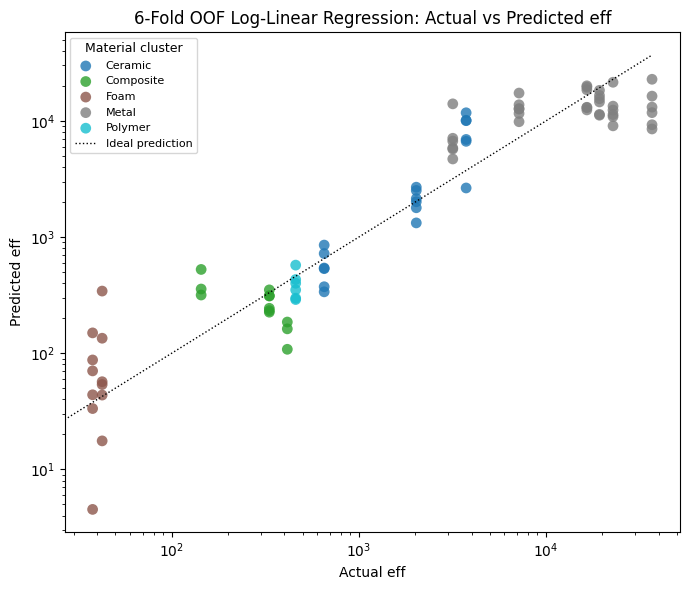

Number of regression features used: 29
['Primary__mean', 'Primary__median', 'Primary__minimum', 'Primary__maximum', 'Primary__absolute_maximum', 'Primary__standard_deviation', 'Primary__variance', 'Primary__root_mean_square', 'Primary__mean_abs_change', 'Primary__mean_change', 'Primary__skewness', 'Primary__kurtosis', 'Primary__abs_energy', 'Primary__sum_values', 'Primary__count_above_mean', 'Primary__count_below_mean', 'Primary__longest_strike_above_mean', 'Primary__longest_strike_below_mean', 'Primary__linear_trend__attr_"slope"', 'Primary__linear_trend__attr_"intercept"', 'Primary__linear_trend__attr_"rvalue"', 'Primary__linear_trend__attr_"pvalue"', 'Primary__linear_trend__attr_"stderr"', 'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_0.2__ql_0.0', 'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_0.2__ql_0.0', 'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.8', 'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_1.0__ql_0.8', 'Primary__ci

In [148]:
log_lin_model, log_lin_features, log_lin_cv, log_lin_overall, log_lin_off, log_lin_pred = (
    simple_log_linear_regression_cv(
        df=FEATURES_TSFRESH[[ 'Primary__mean', 'Primary__median', 'Primary__minimum',
       'Primary__maximum', 'Primary__absolute_maximum',
       'Primary__standard_deviation', 'Primary__variance',
       'Primary__root_mean_square', 'Primary__mean_abs_change',
       'Primary__mean_change', 'Primary__skewness', 'Primary__kurtosis',
       'Primary__abs_energy', 'Primary__sum_values',
       'Primary__count_above_mean', 'Primary__count_below_mean',
       'Primary__longest_strike_above_mean',
       'Primary__longest_strike_below_mean',
       'Primary__linear_trend__attr_"slope"',
       'Primary__linear_trend__attr_"intercept"',
       'Primary__linear_trend__attr_"rvalue"',
       'Primary__linear_trend__attr_"pvalue"',
       'Primary__linear_trend__attr_"stderr"',
       'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_0.2__ql_0.0',
       'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_0.2__ql_0.0',
       'Primary__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.8',
       'Primary__change_quantiles__f_agg_"mean"__isabs_True__qh_1.0__ql_0.8',
       'Primary__cid_ce__normalize_True', 'Primary__cid_ce__normalize_False', 'eff', 'Label']],
        target_col="eff",
        eval_group_col="Label",
        n_splits=6,
        random_state=42,
    )
)

print(f"Number of regression features used: {len(log_lin_features)}")
print(log_lin_features)

In [149]:
log_lin_overall

,mae,rmse,nrmse_range,nrmse_mean,nrmse_std,r2,mape,medape,smape,max_error
0,4046.321338,7593.7428,0.20616,0.936898,0.687517,0.521625,69.521441,41.208418,52.237233,28354.085589


In [150]:
log_lin_off

,group,n,mae,rmse,nrmse_range,nrmse_mean,nrmse_std,r2,mape,medape,smape,max_error
0,ceramic,18,1732.209711,3032.413671,0.981001,1.416081,2.330501,-4.750719,56.741317,31.583391,41.132217,7997.955734
1,composite,12,159.440943,196.367203,0.724435,0.642129,1.890270,-2.897951,69.375235,43.707934,56.562462,382.550691
2,foam,12,56.837522,98.664182,20.955945,2.457820,40.127579,-1755.606512,139.558892,72.528091,70.108052,300.267222
3,metal,36,8485.362440,11398.916509,0.338291,0.645850,1.026501,-0.083810,60.317083,49.167792,54.727699,28354.085589
4,polymer,6,107.138029,118.503804,NaN,0.257778,NaN,0.000000,23.305474,24.209555,26.217390,169.930025


### Features: ESN

#### Target: k

Number of features: 50
Target: k
Evaluation group: Label
Stratify column: Label
Model target transform: log1p(k)
Prediction inverse transform: expm1(predicted log1p(k))
MAE: 79.8384
RMSE: 155.5434
NRMSE range: 0.3938
NRMSE mean: 1.5246
NRMSE std: 0.9612
R2: 0.0051
MAPE: 272.3863%
MedAPE: 87.3084%
SMAPE: 119.5887%
Max error: 341.1949
MAE: 16.2106
RMSE: 27.7833
NRMSE range: 0.3058
NRMSE mean: 1.6288
NRMSE std: 0.9401
R2: 0.0483
MAPE: 178.5926%
MedAPE: 139.2381%
SMAPE: 106.9282%
Max error: 78.5337
MAE: 47.2046
RMSE: 104.5071
NRMSE range: 0.2646
NRMSE mean: 1.6780
NRMSE std: 0.8536
R2: 0.2153
MAPE: 202.7456%
MedAPE: 100.0000%
SMAPE: 121.5007%
Max error: 345.2006
MAE: 41.2072
RMSE: 97.1124
NRMSE range: 0.2459
NRMSE mean: 1.9197
NRMSE std: 0.9176
R2: 0.0932
MAPE: 319.1138%
MedAPE: 100.0000%
SMAPE: 117.7081%
Max error: 345.5450
MAE: 22.9414
RMSE: 55.1977
NRMSE range: 0.1398
NRMSE mean: 0.9277
NRMSE std: 0.4856
R2: 0.7461
MAPE: 241.8303%
MedAPE: 100.0000%
SMAPE: 102.5135%
Max error: 197.1125
M

/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:211: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users

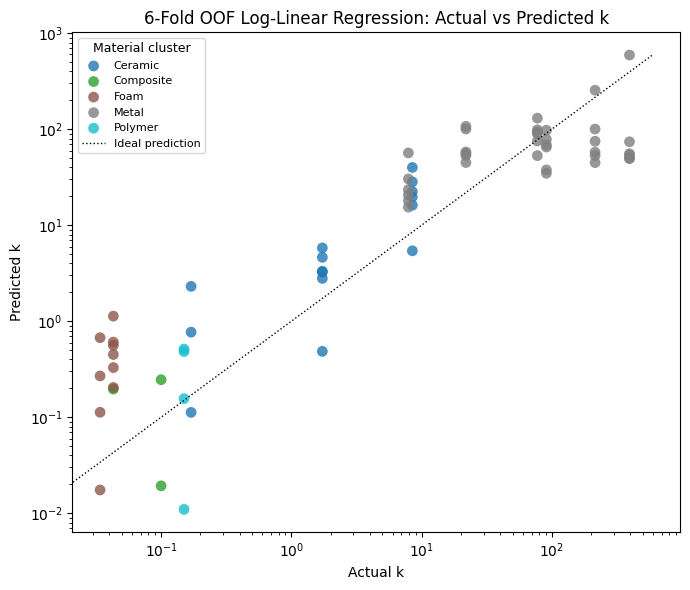

In [151]:
log_esn_model, log_esn_features, log_esn_cv, log_esn_overall, log_esn_off, log_esn_pred = (
    simple_log_linear_regression_cv(
        df=FEATURES_ESN[[c for c in FEATURES_ESN.columns if 'esn' in c] + ['k', 'Label']],
        target_col="k",
        eval_group_col="Label",
        n_splits=6,
        random_state=42,
    )
)

In [152]:
log_esn_overall

,mae,rmse,nrmse_range,nrmse_mean,nrmse_std,r2,mape,medape,smape,max_error
0,41.574746,95.152691,0.240914,1.626562,0.860301,0.250965,238.267165,100.0,115.47208,345.545047


In [153]:
log_esn_off

,group,n,mae,rmse,nrmse_range,nrmse_mean,nrmse_std,r2,mape,medape,smape,max_error
0,ceramic,18,5.715267,10.021584,1.203071,2.890842,2.693642,-6.682514,204.812153,100.000000,107.642366,31.470642
1,composite,12,0.082939,0.091587,1.606783,1.280932,3.076755,-9.327005,123.647437,100.000000,178.988698,0.153518
2,foam,12,0.338491,0.457807,50.867470,11.891097,97.403790,-10348.998205,840.474184,678.960101,157.260847,1.086868
3,metal,36,93.977905,145.175010,0.375052,1.077739,1.065992,-0.168805,111.027279,77.209850,81.540896,345.545047
4,polymer,6,0.190345,0.226431,NaN,1.509543,NaN,0.000000,126.896939,100.000000,131.937556,0.363918


#### Target: eff

Number of features: 50
Target: eff
Evaluation group: Label
Stratify column: Label
Model target transform: log1p(eff)
Prediction inverse transform: expm1(predicted log1p(eff))
MAE: 6433.9160
RMSE: 11413.0264
NRMSE range: 0.3098
NRMSE mean: 0.9530
NRMSE std: 0.7628
R2: 0.3733
MAPE: 76.7176%
MedAPE: 42.9131%
SMAPE: 63.4491%
Max error: 27663.3354
MAE: 3074.6930
RMSE: 4724.1003
NRMSE range: 0.2451
NRMSE mean: 1.0290
NRMSE std: 0.7666
R2: 0.3672
MAPE: 81.1568%
MedAPE: 48.5816%
SMAPE: 55.5694%
Max error: 12214.3575
MAE: 4470.2156
RMSE: 8384.6564
NRMSE range: 0.2276
NRMSE mean: 1.1466
NRMSE std: 0.7249
R2: 0.4341
MAPE: 85.1137%
MedAPE: 68.1088%
SMAPE: 73.7619%
Max error: 27054.4024
MAE: 4760.2740
RMSE: 8994.4900
NRMSE range: 0.2442
NRMSE mean: 1.1175
NRMSE std: 0.7979
R2: 0.3144
MAPE: 47.1151%
MedAPE: 40.1338%
SMAPE: 49.7182%
Max error: 28330.5304
MAE: 4805.9926
RMSE: 9956.4112
NRMSE range: 0.2703
NRMSE mean: 1.1860
NRMSE std: 0.8805
R2: 0.1650
MAPE: 84.9995%
MedAPE: 57.2121%
SMAPE: 55.2261%
M

/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:211: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/markkeanujamesexconde/Library/CloudStorage/OneDrive-Personal/Documents/Academe Files/4. Doctoral/Research 1 - Warmth Sensor/Warmth-Sensor-Object-Detection/.venv/lib/python3.13/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users

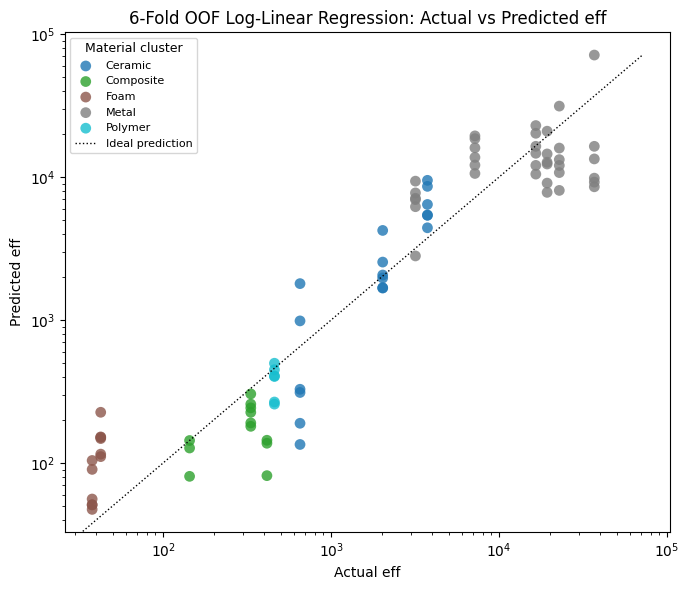

In [154]:
log_esn_model, log_esn_features, log_esn_cv, log_esn_overall, log_esn_off, log_esn_pred = (
    simple_log_linear_regression_cv(
        df=FEATURES_ESN[[c for c in FEATURES_ESN.columns if 'esn' in c] + ['eff', 'Label']],
        target_col="eff",
        eval_group_col="Label",
        n_splits=6,
        random_state=42,
    )
)

In [155]:
log_esn_overall

,mae,rmse,nrmse_range,nrmse_mean,nrmse_std,r2,mape,medape,smape,max_error
0,4575.491219,8609.944914,0.233748,1.062274,0.779521,0.385025,72.308812,47.766354,57.744613,34410.515842


In [156]:
log_esn_off

,group,n,mae,rmse,nrmse_range,nrmse_mean,nrmse_std,r2,mape,medape,smape,max_error
0,ceramic,18,1328.513669,2070.497668,0.669816,0.966884,1.591240,-1.680987,61.850696,50.374919,53.094638,5735.123247
1,composite,12,129.430317,166.908069,0.615755,0.545796,1.606691,-1.816133,37.172544,37.326071,51.403122,333.205674
2,foam,12,68.437094,84.931692,18.039210,2.115730,34.542457,-1300.652346,165.259449,165.945980,79.132307,183.695101
3,metal,36,9930.533777,13069.626543,0.387873,0.740510,1.176953,-0.424795,66.968010,54.305432,60.642406,34410.515842
4,polymer,6,92.398574,119.444519,NaN,0.259825,NaN,0.000000,20.099236,12.013816,24.215366,201.759505
